# Loading Data & Libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as px
import matplotlib
from sklearn.model_selection import train_test_split
import random
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score,roc_auc_score

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from scipy import stats
import itertools  
from scipy.stats import mannwhitneyu
from sklearn.tree import  plot_tree 
import numpy as np
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import model_selection
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import cross_val_score
font = {#'family' : 'normal',
        #'weight' : 'bold',
        'size'   : 15}
matplotlib.rc('font', **font)
import os
from sklearn.ensemble import IsolationForest
import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", None)

In [2]:
data=pd.read_csv("Understanding and Managing Employee Turnover.csv")
data.drop("Unnamed: 0",inplace=True,axis=1)
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,College,Life_Sciences,Medium,Female,94,High,2,Sales_Executive,Very_High,Single,5993,19479,8,Yes,11,Excellent,Low,0,8,0,Bad,6,4,0,5
1,49,No,Travel_Frequently,279,Research_Development,8,Below_College,Life_Sciences,High,Male,61,Medium,2,Research_Scientist,Medium,Married,5130,24907,1,No,23,Outstanding,Very_High,1,10,3,Better,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research_Development,2,College,Other,Very_High,Male,92,Medium,1,Laboratory_Technician,High,Single,2090,2396,6,Yes,15,Excellent,Medium,0,7,3,Better,0,0,0,0
3,33,No,Travel_Frequently,1392,Research_Development,3,Master,Life_Sciences,Very_High,Female,56,High,1,Research_Scientist,High,Married,2909,23159,1,Yes,11,Excellent,High,0,8,3,Better,8,7,3,0
4,27,No,Travel_Rarely,591,Research_Development,2,Below_College,Medical,Low,Male,40,High,1,Laboratory_Technician,Medium,Married,3468,16632,9,No,12,Excellent,Very_High,1,6,3,Better,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research_Development,23,College,Medical,High,Male,41,Very_High,2,Laboratory_Technician,Very_High,Married,2571,12290,4,No,17,Excellent,High,1,17,3,Better,5,2,0,3
1466,39,No,Travel_Rarely,613,Research_Development,6,Below_College,Medical,Very_High,Male,42,Medium,3,Healthcare_Representative,Low,Married,9991,21457,4,No,15,Excellent,Low,1,9,5,Better,7,7,1,7
1467,27,No,Travel_Rarely,155,Research_Development,4,Bachelor,Life_Sciences,Medium,Male,87,Very_High,2,Manufacturing_Director,Medium,Married,6142,5174,1,Yes,20,Outstanding,Medium,1,6,0,Better,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,Bachelor,Medical,Very_High,Male,63,Medium,2,Sales_Executive,Medium,Married,5390,13243,2,No,14,Excellent,Very_High,0,17,3,Good,9,6,0,8


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   object
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   object
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   object
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [4]:
#convert JobLevel & StockOptionLevel string/object data type (since its categorical)
data.JobLevel=data.JobLevel.astype('object')
data.StockOptionLevel=data.StockOptionLevel.astype('object')

In [5]:
cat=data.select_dtypes(include=['object', 'string']).columns
for i in cat:
    print(f'"{i}" [{len(data[i].unique())}]: {data[i].unique()} \n')

"Attrition" [2]: ['Yes' 'No'] 

"BusinessTravel" [3]: ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel'] 

"Department" [3]: ['Sales' 'Research_Development' 'Human_Resources'] 

"Education" [5]: ['College' 'Below_College' 'Master' 'Bachelor' 'Doctor'] 

"EducationField" [6]: ['Life_Sciences' 'Other' 'Medical' 'Marketing' 'Technical_Degree'
 'Human_Resources'] 

"EnvironmentSatisfaction" [4]: ['Medium' 'High' 'Very_High' 'Low'] 

"Gender" [2]: ['Female' 'Male'] 

"JobInvolvement" [4]: ['High' 'Medium' 'Very_High' 'Low'] 

"JobLevel" [5]: [2 1 3 4 5] 

"JobRole" [9]: ['Sales_Executive' 'Research_Scientist' 'Laboratory_Technician'
 'Manufacturing_Director' 'Healthcare_Representative' 'Manager'
 'Sales_Representative' 'Research_Director' 'Human_Resources'] 

"JobSatisfaction" [4]: ['Very_High' 'Medium' 'High' 'Low'] 

"MaritalStatus" [3]: ['Single' 'Married' 'Divorced'] 

"OverTime" [2]: ['Yes' 'No'] 

"PerformanceRating" [2]: ['Excellent' 'Outstanding'] 

"RelationshipSatisfaction" [4]: [

In [6]:
#Change Target variable "Attrition" into binary (1 for Yes and 0 for No)
#data['Attrition'] = data['Attrition'].apply(lambda x: 1 if x == 'Yes' else 0)


In [7]:
#missing values?
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

# Summarizing data to understand average monthly income distribution among different group

<AxesSubplot: xlabel='MonthlyIncome', ylabel='Count'>

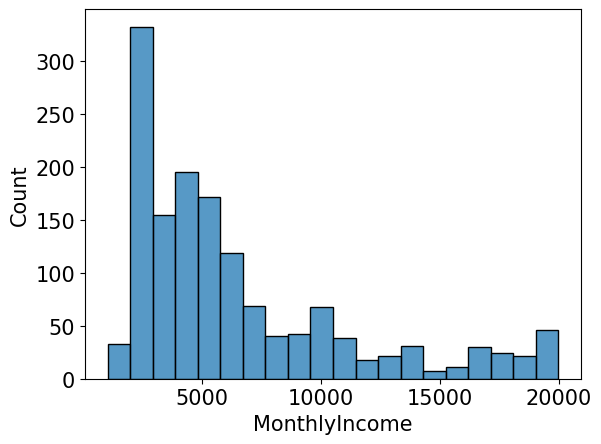

In [8]:
sns.histplot(data.MonthlyIncome)

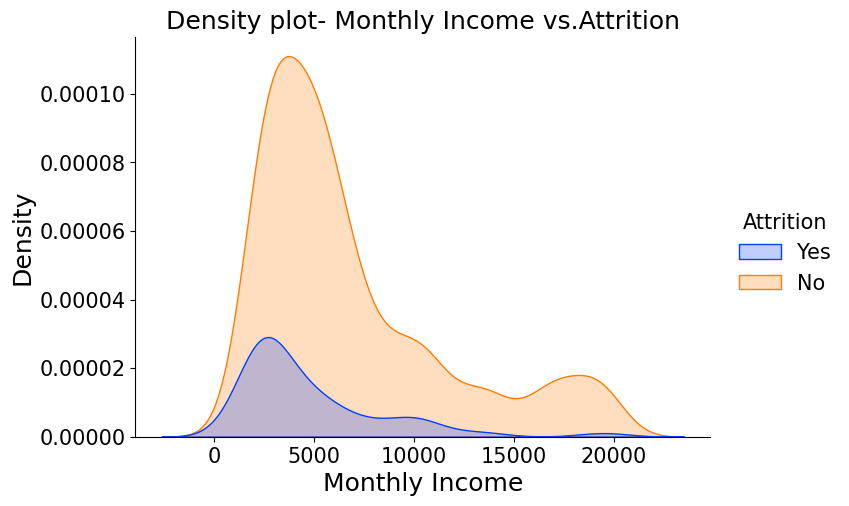

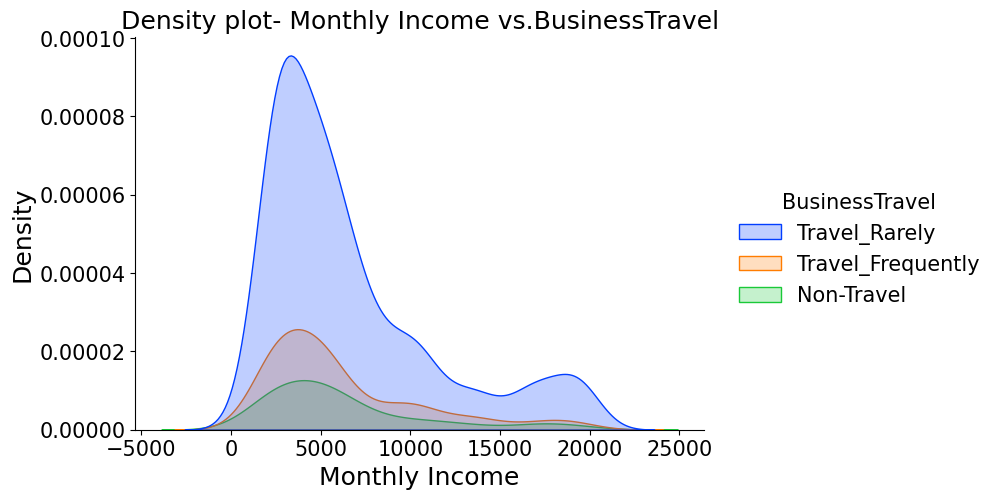

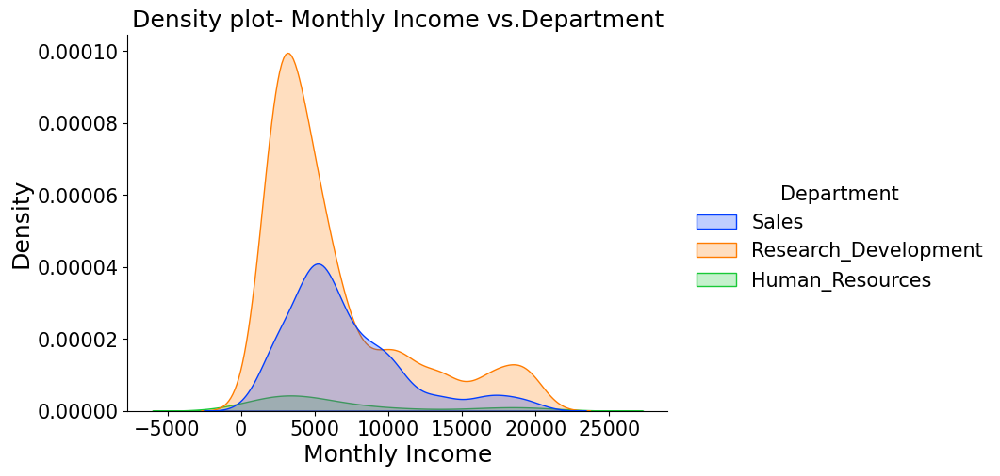

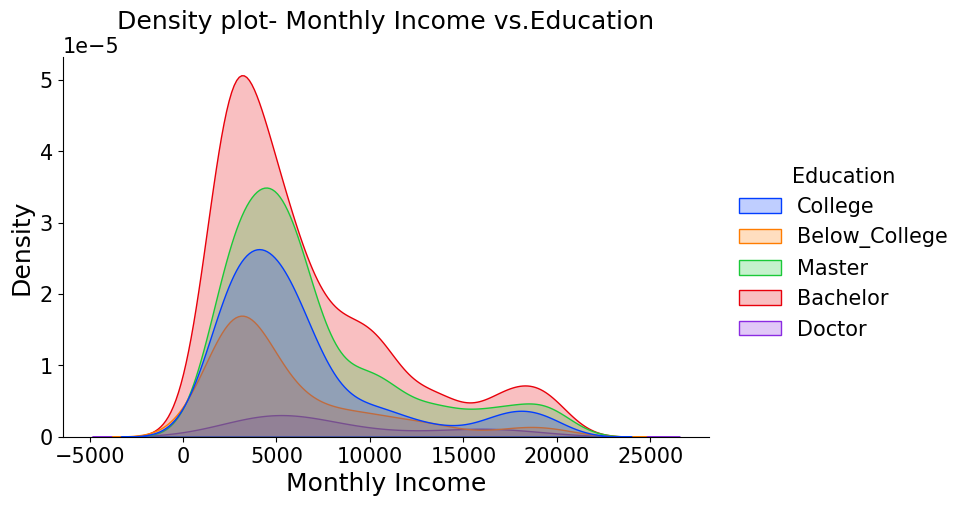

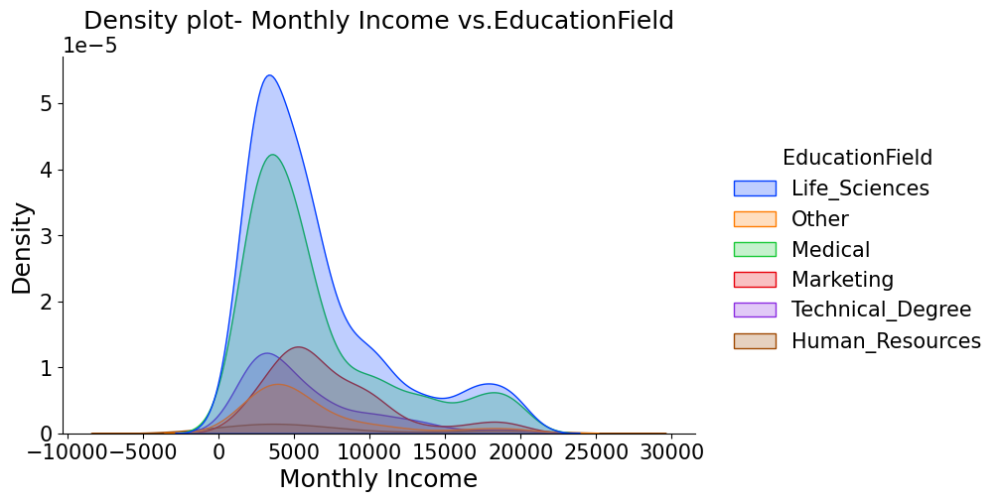

...

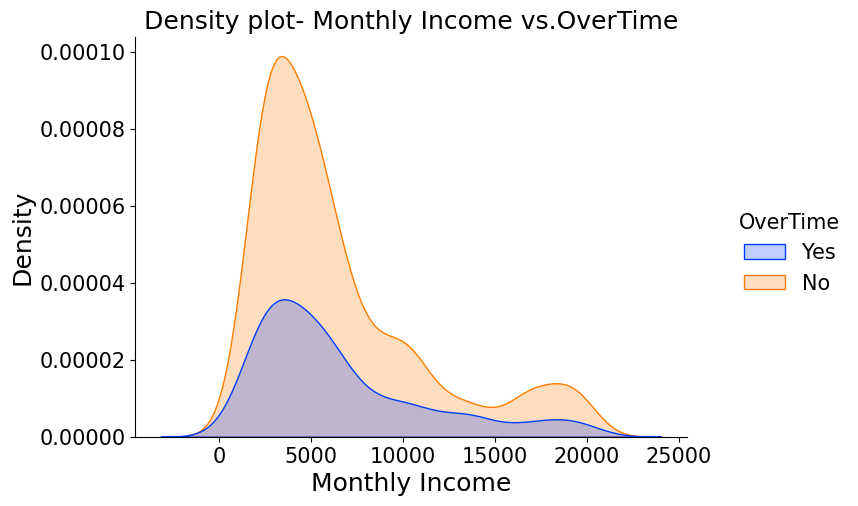

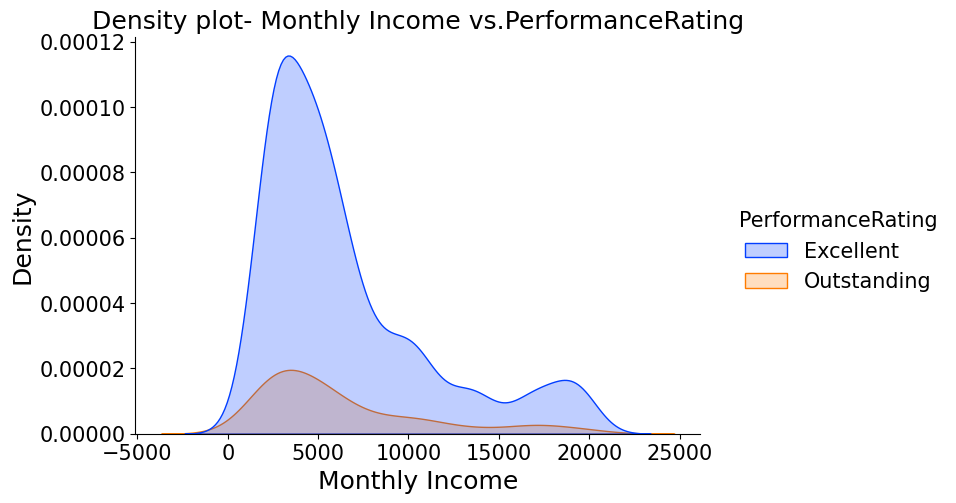

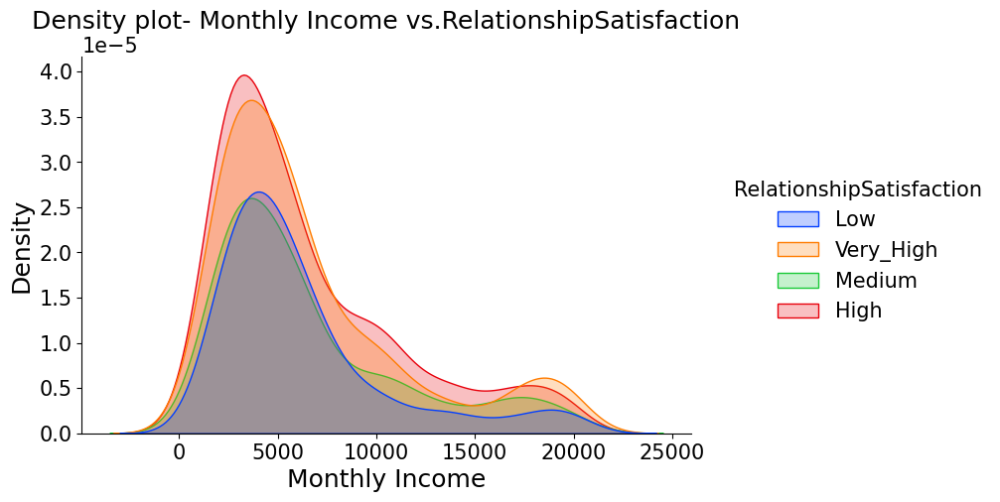

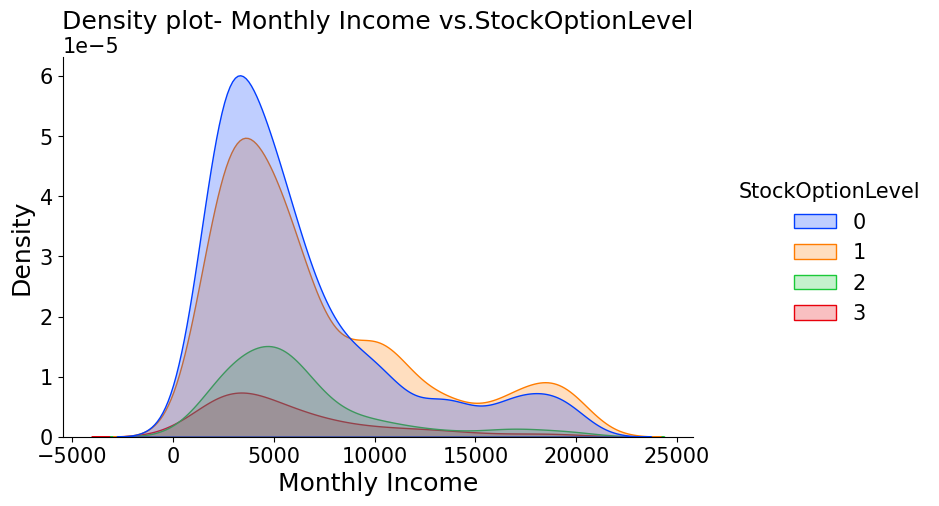

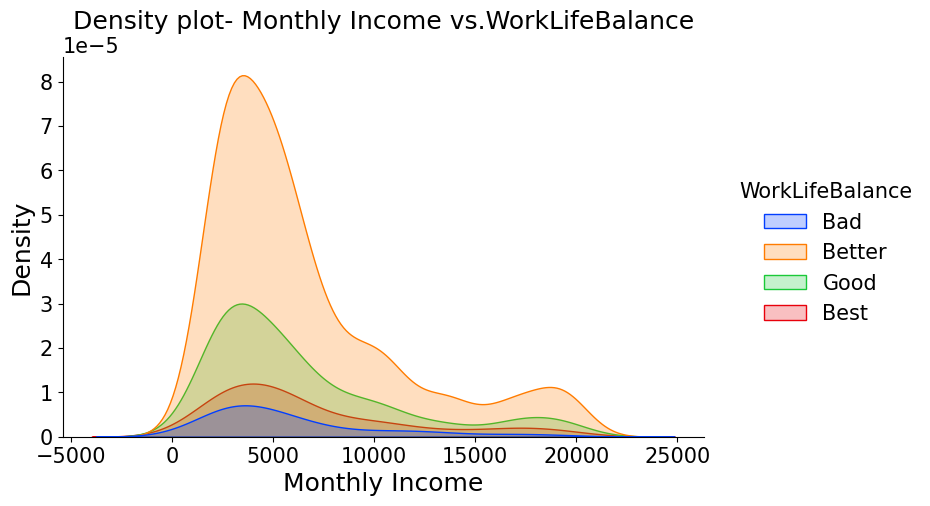

In [9]:
for col in data.describe(include=['object']).columns:    
    sns.displot(data=data, x='MonthlyIncome', hue=col, kind='kde', fill=True, palette=sns.color_palette('bright')[:len(data[col].unique())], height=5, aspect=1.5)
    plt.xlabel('Monthly Income', fontsize=18)
    plt.ylabel('Density', fontsize=18)
    plt.title('Density plot- Monthly Income vs.{}'.format(col), fontsize=18)
    plt.show()

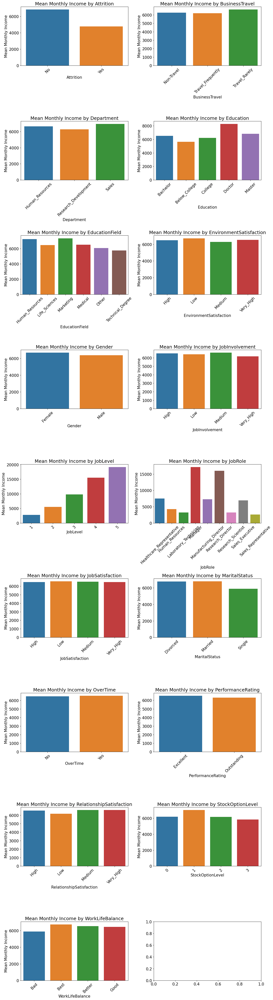

In [10]:
categorical_variables = data.select_dtypes(include=['object', 'string']).columns
mean_incomes = [data.groupby(var)['MonthlyIncome'].mean() for var in categorical_variables]

n_rows = len(categorical_variables) // 2 if len(categorical_variables) % 2 == 0 else len(categorical_variables) // 2 + 1

fig, axes = plt.subplots(n_rows, 2,figsize=(15, n_rows * 6))

for i, (var, mean_income) in enumerate(zip(categorical_variables, mean_incomes)):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    sns.barplot(x=mean_income.index, y=mean_income, ax=ax)
    
    ax.set_title(f'Mean Monthly Income by {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Mean Monthly Income')
    ax.set_xticklabels(mean_income.index, rotation=45)

plt.tight_layout()
plt.show()


Employees who have left the company have a lower monthly income compared to the ones that stayed. 

As monthly income increase so does: age, job level, total working years, years with current manager, years in current role, year since last promotion. Therefore the more years you work and get experience the higher your wage becomes. 

Looking at the qualitative variables, monthly income changes between people with different education level (doctors are the highest), education field (HR & Marekting are the highest), and job roles (Research director & Manager are the highest). Therefore job role and education background affect monthly income the most.


# Detecting Outliers

array([[<AxesSubplot: title={'center': 'Age'}>,
        <AxesSubplot: title={'center': 'DailyRate'}>,
        <AxesSubplot: title={'center': 'DistanceFromHome'}>,
        <AxesSubplot: title={'center': 'HourlyRate'}>],
       [<AxesSubplot: title={'center': 'MonthlyIncome'}>,
        <AxesSubplot: title={'center': 'MonthlyRate'}>,
        <AxesSubplot: title={'center': 'NumCompaniesWorked'}>,
        <AxesSubplot: title={'center': 'PercentSalaryHike'}>],
       [<AxesSubplot: title={'center': 'TotalWorkingYears'}>,
        <AxesSubplot: title={'center': 'TrainingTimesLastYear'}>,
        <AxesSubplot: title={'center': 'YearsAtCompany'}>,
        <AxesSubplot: title={'center': 'YearsInCurrentRole'}>],
       [<AxesSubplot: title={'center': 'YearsSinceLastPromotion'}>,
        <AxesSubplot: title={'center': 'YearsWithCurrManager'}>,
        <AxesSubplot: >, <AxesSubplot: >]], dtype=object)

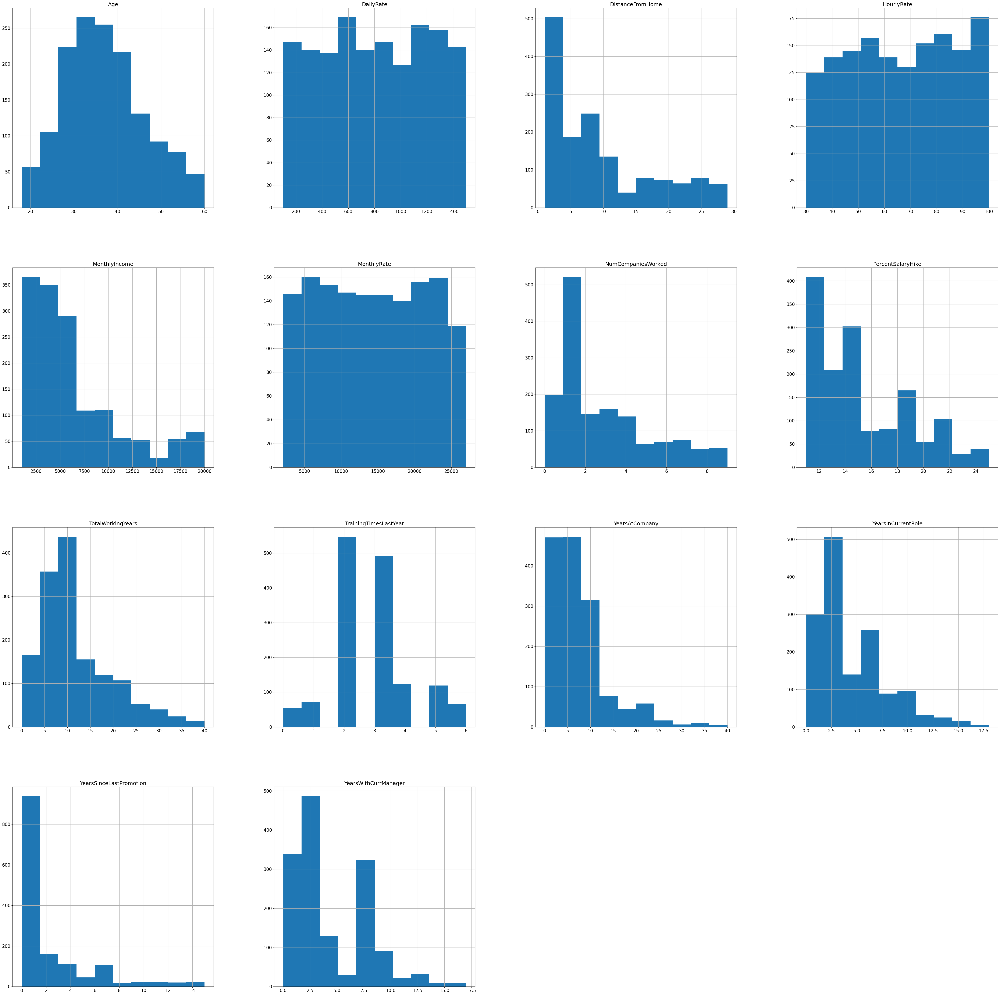

In [11]:
data.hist(figsize=(60,60))


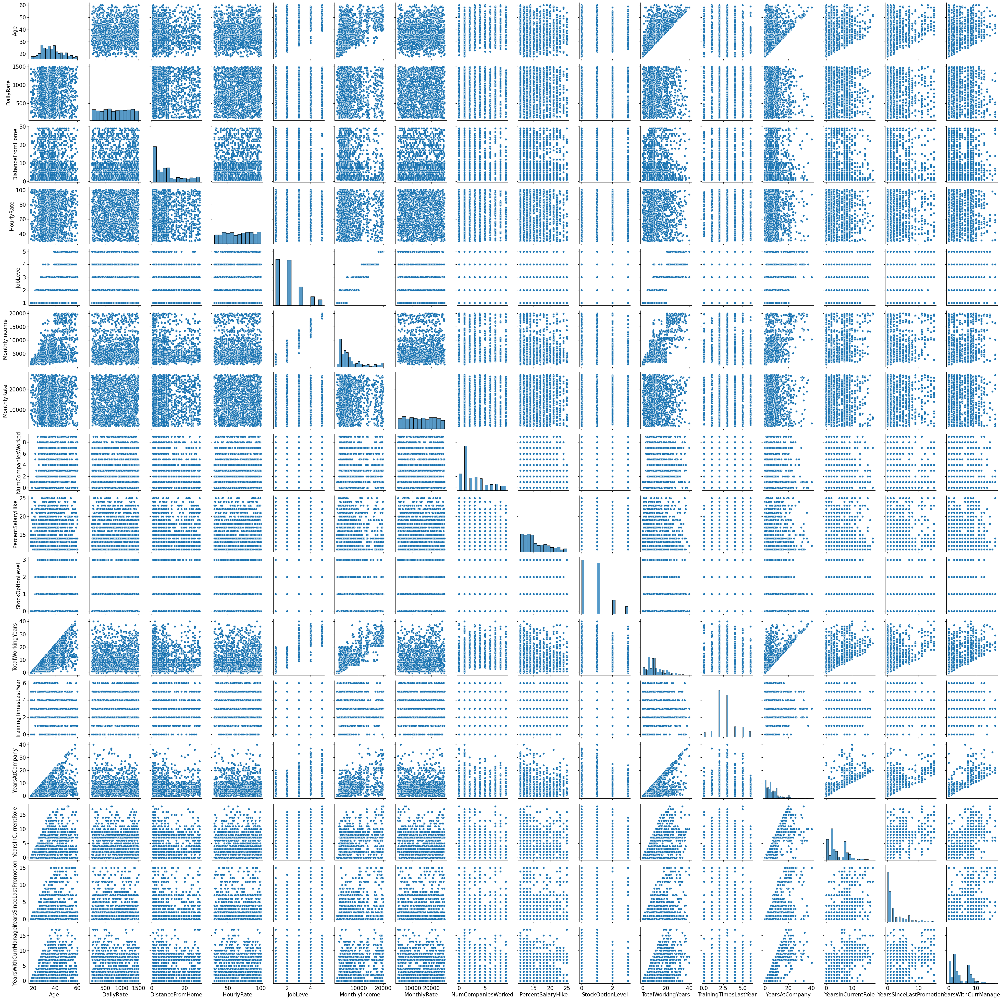

In [12]:
sns.pairplot(data, diag_kind='hist')


In [13]:
#using z-score for quantitative variables
from scipy.stats import zscore
z_score=zscore(data.select_dtypes(include=['int64', 'float64']))
outliers_z_score=data[(z_score >=3) | (z_score <=-3)].dropna(how='all')
outliers_z_score

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0
45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN
62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,NaN,13.0,NaN
63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.0,NaN,NaN
64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.0
1351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,NaN,NaN
1401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,NaN
1414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,NaN


In [14]:
print('% of outlier via z-score:',len(outliers_z_score) / len(data) *100)

% of outlier via z-score: 5.646258503401361


Median value of Data 36.0
The 25th Percentile of Data 30.0
The 75th Percentile of  Data  43.0
The IQR of  Data  13.0
The Lower Range of  Data  10.5
The Upper Range of  Data  62.5
 Number of outliers:0 


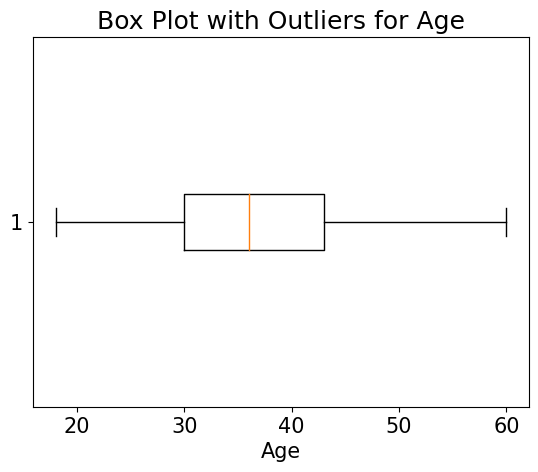

------------------------------------------------------------------------------------------------- 

Median value of Data 802.0
The 25th Percentile of Data 465.0
The 75th Percentile of  Data  1157.0
The IQR of  Data  692.0
The Lower Range of  Data  0
The Upper Range of  Data  2195.0
 Number of outliers:0 


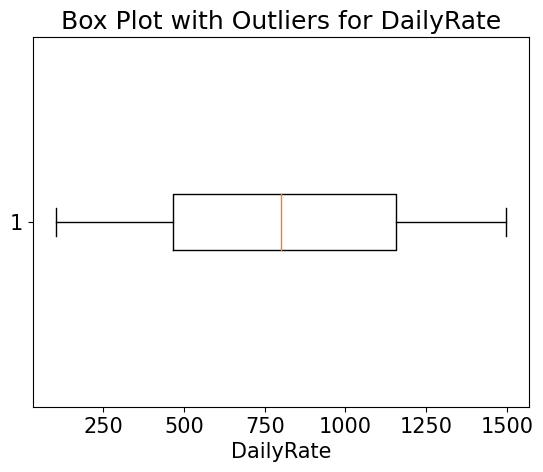

------------------------------------------------------------------------------------------------- 

Median value of Data 7.0
The 25th Percentile of Data 2.0
The 75th Percentile of  Data  14.0
The IQR of  Data  12.0
The Lower Range of  Data  0
The Upper Range of  Data  32.0
 Number of outliers:0 


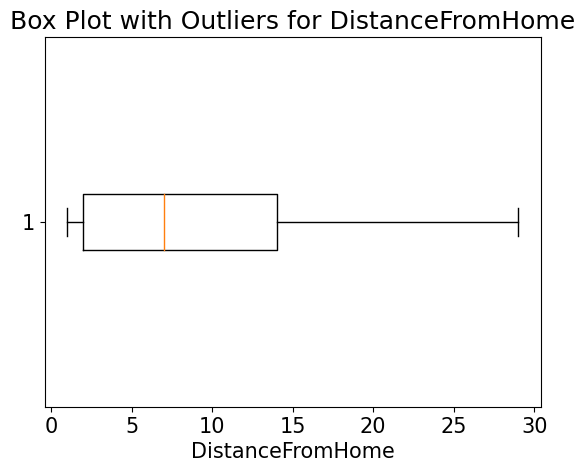

------------------------------------------------------------------------------------------------- 

Median value of Data 66.0
The 25th Percentile of Data 48.0
The 75th Percentile of  Data  83.75
The IQR of  Data  35.75
The Lower Range of  Data  0
The Upper Range of  Data  137.375
 Number of outliers:0 


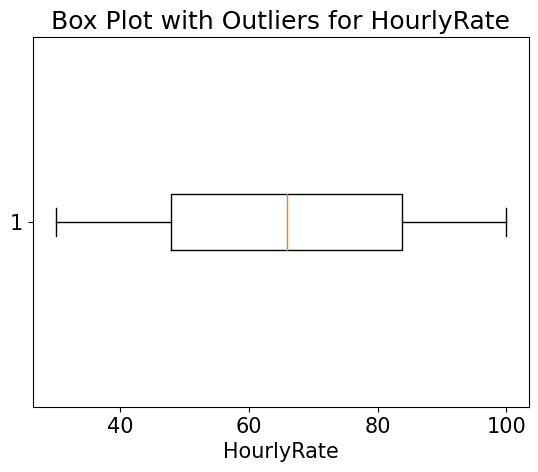

------------------------------------------------------------------------------------------------- 

Median value of Data 4919.0
The 25th Percentile of Data 2911.0
The 75th Percentile of  Data  8379.0
The IQR of  Data  5468.0
The Lower Range of  Data  0
The Upper Range of  Data  16581.0
 Number of outliers:114 


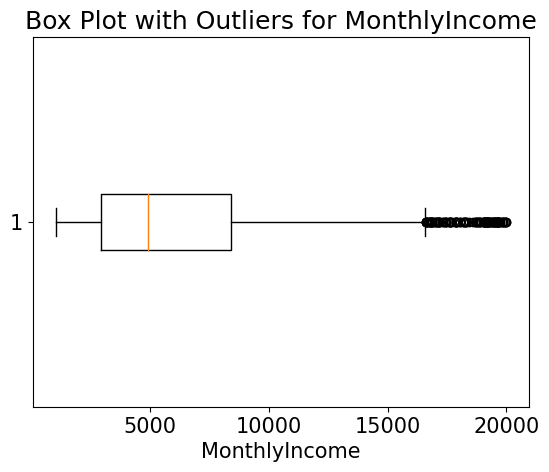

------------------------------------------------------------------------------------------------- 

Median value of Data 14235.5
The 25th Percentile of Data 8047.0
The 75th Percentile of  Data  20461.5
The IQR of  Data  12414.5
The Lower Range of  Data  0
The Upper Range of  Data  39083.25
 Number of outliers:0 


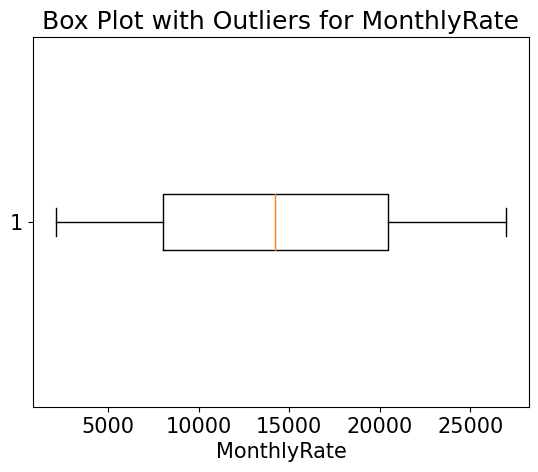

------------------------------------------------------------------------------------------------- 

Median value of Data 2.0
The 25th Percentile of Data 1.0
The 75th Percentile of  Data  4.0
The IQR of  Data  3.0
The Lower Range of  Data  0
The Upper Range of  Data  8.5
 Number of outliers:52 


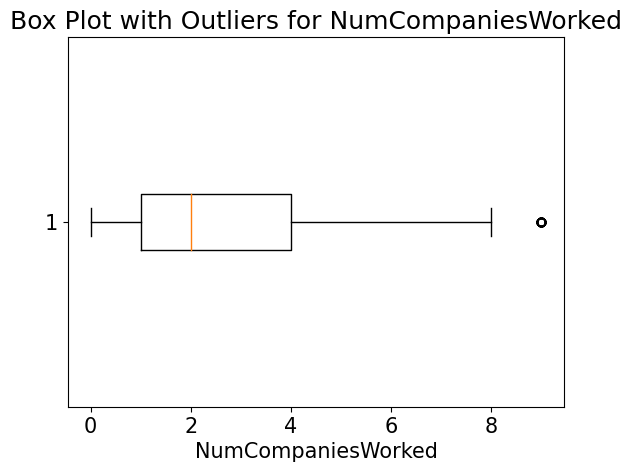

------------------------------------------------------------------------------------------------- 

Median value of Data 14.0
The 25th Percentile of Data 12.0
The 75th Percentile of  Data  18.0
The IQR of  Data  6.0
The Lower Range of  Data  3.0
The Upper Range of  Data  27.0
 Number of outliers:0 


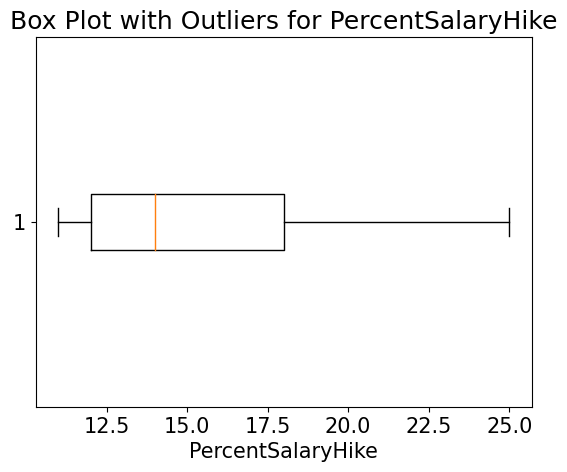

------------------------------------------------------------------------------------------------- 

Median value of Data 10.0
The 25th Percentile of Data 6.0
The 75th Percentile of  Data  15.0
The IQR of  Data  9.0
The Lower Range of  Data  0
The Upper Range of  Data  28.5
 Number of outliers:63 


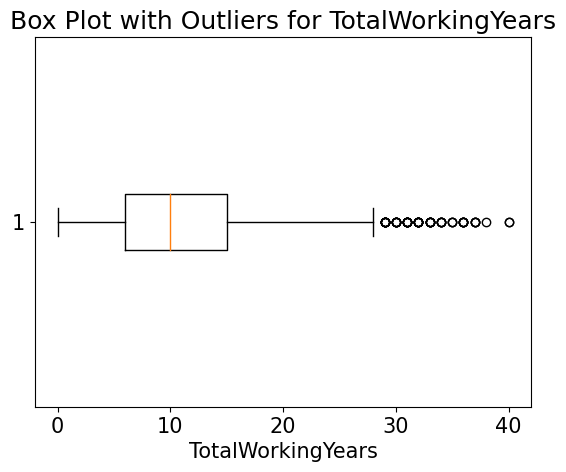

------------------------------------------------------------------------------------------------- 

Median value of Data 3.0
The 25th Percentile of Data 2.0
The 75th Percentile of  Data  3.0
The IQR of  Data  1.0
The Lower Range of  Data  0.5
The Upper Range of  Data  4.5
 Number of outliers:238 


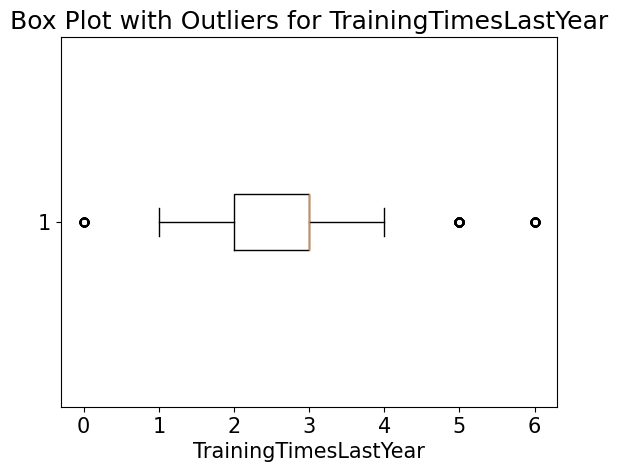

------------------------------------------------------------------------------------------------- 

Median value of Data 5.0
The 25th Percentile of Data 3.0
The 75th Percentile of  Data  9.0
The IQR of  Data  6.0
The Lower Range of  Data  0
The Upper Range of  Data  18.0
 Number of outliers:104 


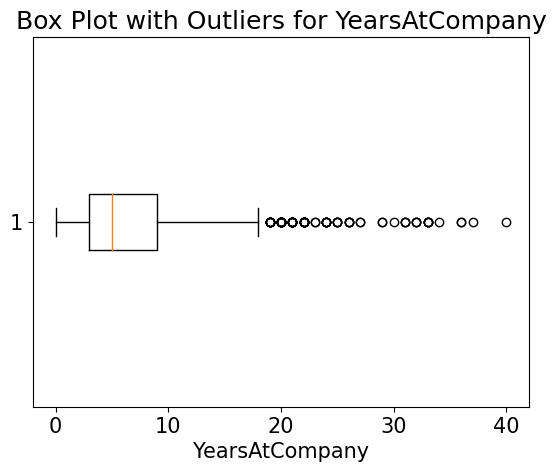

------------------------------------------------------------------------------------------------- 

Median value of Data 3.0
The 25th Percentile of Data 2.0
The 75th Percentile of  Data  7.0
The IQR of  Data  5.0
The Lower Range of  Data  0
The Upper Range of  Data  14.5
 Number of outliers:21 


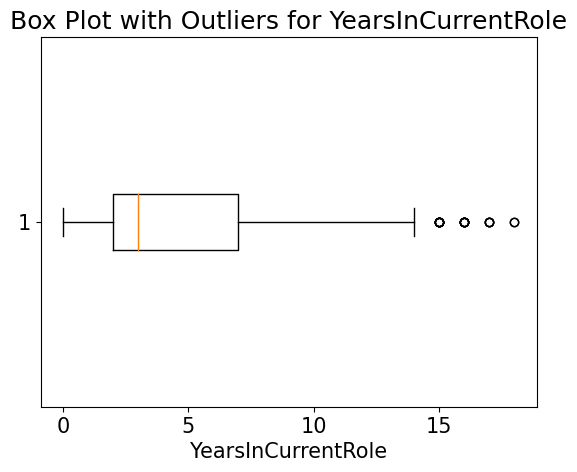

------------------------------------------------------------------------------------------------- 

Median value of Data 1.0
The 25th Percentile of Data 0.0
The 75th Percentile of  Data  3.0
The IQR of  Data  3.0
The Lower Range of  Data  0
The Upper Range of  Data  7.5
 Number of outliers:107 


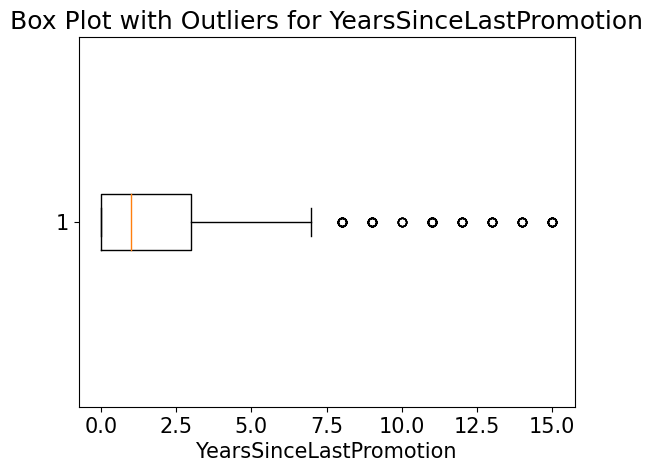

------------------------------------------------------------------------------------------------- 

Median value of Data 3.0
The 25th Percentile of Data 2.0
The 75th Percentile of  Data  7.0
The IQR of  Data  5.0
The Lower Range of  Data  0
The Upper Range of  Data  14.5
 Number of outliers:14 


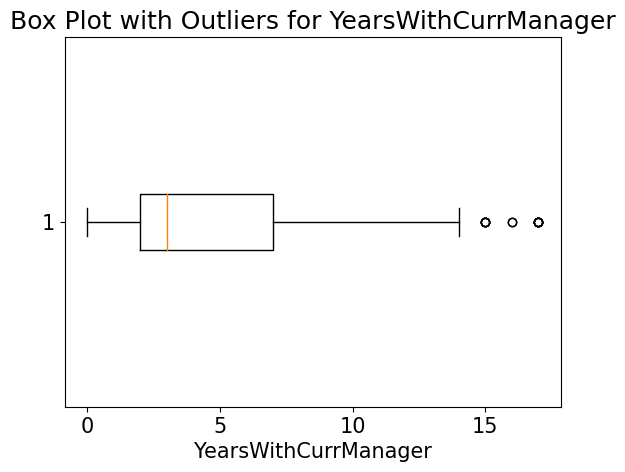

------------------------------------------------------------------------------------------------- 



,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
25,53,No,Travel_Rarely,1282,Research_Development,5,Bachelor,Other,High,Female,58,High,5,Manager,High,Divorced,19094,10735,4,No,11,Excellent,Very_High,1,26,3,Good,14,13,4,8
29,46,No,Travel_Rarely,705,Sales,2,Master,Marketing,Medium,Female,83,High,5,Manager,Low,Single,18947,22822,3,No,12,Excellent,Very_High,0,22,2,Good,2,2,2,1
45,41,Yes,Travel_Rarely,1360,Research_Development,12,Bachelor,Technical_Degree,Medium,Female,49,High,5,Research_Director,High,Married,19545,16280,1,No,12,Excellent,Very_High,0,23,0,Better,22,15,15,8
62,50,No,Travel_Rarely,989,Research_Development,7,College,Medical,Medium,Female,43,Medium,5,Research_Director,High,Divorced,18740,16701,5,Yes,12,Excellent,Very_High,1,29,2,Good,27,3,13,8
105,59,No,Non-Travel,1420,Human_Resources,2,Master,Human_Resources,High,Female,32,Medium,5,Manager,Very_High,Married,18844,21922,9,No,21,Outstanding,Very_High,1,30,3,Better,3,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1444,56,Yes,Travel_Rarely,310,Research_Development,7,College,Technical_Degree,Very_High,Male,72,High,1,Laboratory_Technician,High,Married,2339,3666,8,No,11,Excellent,Very_High,1,14,4,Bad,10,9,9,8
1447,36,No,Non-Travel,301,Sales,15,Master,Marketing,Very_High,Male,88,Low,2,Sales_Executive,Very_High,Divorced,5406,10436,1,No,24,Outstanding,Low,1,15,4,Good,15,12,11,11
153,45,No,Travel_Rarely,194,Research_Development,9,Bachelor,Life_Sciences,Medium,Male,60,High,2,Laboratory_Technician,Medium,Divorced,2348,10901,8,No,18,Excellent,High,1,20,2,Bad,17,9,0,15
635,35,No,Travel_Rarely,607,Research_Development,9,Bachelor,Life_Sciences,Very_High,Female,66,Medium,3,Manufacturing_Director,High,Married,10685,23457,1,Yes,20,Outstanding,Medium,1,17,2,Better,17,14,5,15


In [15]:
#using Interquartile range (IQR) for quantitative variables
outlier_IQR=[]
for i in data.select_dtypes(include=['int64', 'float64']):
    Q1,Q2,Q3 = np.percentile(data[i] , [25,50,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    print("Median value of Data",Q2)
    print("The 25th Percentile of Data",Q1)
    print("The 75th Percentile of  Data ",Q3)
    print("The IQR of  Data ", IQR)
    print("The Lower Range of  Data ",max(0,lower_range))
    print("The Upper Range of  Data ",upper_range)
    
    count=0
    for indx,j in enumerate(data[i]):
        if (j> upper_range) | (j<lower_range):
            count+=1
            outlier_IQR.append(indx)
            
    print(f"\033[1m Number of outliers:{count} \033[0m")
    plt.boxplot(data[i], whis=1.5, showfliers=True,showmeans=False,vert=False)
    plt.xlabel(i)
    plt.title(f'Box Plot with Outliers for {i}')
    plt.show()
    print('------------------------------------------------------------------------------------------------- \n')
    
outlier_IQR=data.iloc[outlier_IQR].drop_duplicates()
outlier_IQR

In [16]:
print('% of outlier via IQR:',len(outlier_IQR) / len(data) *100)

% of outlier via IQR: 32.99319727891156


In [17]:
#Using Gower Distance for categorical & numerical outliers
import pandas as pd
import numpy as np
from sklearn.neighbors import DistanceMetric

S=None
count=0
for i in data:
    count+=1
    if data[i].dtype == 'object':
        dummy_df = pd.get_dummies(data.loc[:,i])
        s = DistanceMetric.get_metric('dice').pairwise(dummy_df)
    else:
        s = DistanceMetric.get_metric('manhattan').pairwise(data[[i]])
        s = s/max(np.ptp(data[i]),1)
    
    if S is None:
        S = pd.DataFrame(s)
    else:
        S = S + pd.DataFrame(s)
    
S /= count
S

0         1         2         3         4         5         6     \
0     0.000000  0.625817  0.417556  0.461648  0.548613  0.413196  0.539687   
1     0.625817  0.000000  0.584169  0.423130  0.364335  0.462496  0.511932   
2     0.417556  0.584169  0.000000  0.393252  0.424826  0.358641  0.445662   
3     0.461648  0.423130  0.393252  0.000000  0.415950  0.287922  0.464753   
4     0.548613  0.364335  0.424826  0.415950  0.000000  0.392835  0.447802   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.552858  0.349904  0.461377  0.436581  0.318217  0.333679  0.418509   
1466  0.566887  0.340408  0.460583  0.451496  0.288770  0.457190  0.460620   
1467  0.499999  0.337629  0.466226  0.493432  0.416397  0.516690  0.402942   
1468  0.483106  0.335241  0.495311  0.439069  0.402517  0.352658  0.477452   
1469  0.452236  0.457992  0.404287  0.436270  0.331092  0.383446  0.347027   

          7         8         9         10        11        12        13    \
0     0.605998  0.622333  0.522936  0.593458  0.396546  0.569159  0.464706   
1     0.388074  0.337703  0.466116  0.408392  0.409240  0.387506  0.510683   
2     0.360918  0.433031  0.469952  0.430334  0.309530  0.506187  0.372973   
3     0.396775  0.433647  0.469410  0.415430  0.323814  0.403120  0.413857   
4     0.330549  0.540432  0.393249  0.203843  0.421894  0.261195  0.284188   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.405884  0.447933  0.356363  0.244104  0.410595  0.415778  0.258089   
1466  0.419634  0.386573  0.380646  0.321673  0.417746  0.410771  0.413211   
1467  0.369537  0.362940  0.461143  0.334200  0.426038  0.461894  0.430827   
1468  0.546254  0.401414  0.359085  0.386443  0.401433  0.485329  0.507028   
1469  0.424561  0.439620  0.305127  0.246963  0.363486  0.416643  0.317924   

          14        15        16        17        18        19        20    \
0     0.467379  0.531757  0.495364  0.540358  0.462783  0.398714  0.557941   
1     0.486511  0.501648  0.425229  0.614600  0.470431  0.477701  0.477501   
2     0.216058  0.587044  0.434926  0.334700  0.547696  0.302550  0.491716   
3     0.418178  0.388804  0.416263  0.463735  0.373887  0.258144  0.514533   
4     0.403923  0.477143  0.349099  0.446476  0.497264  0.342527  0.438059   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.411640  0.413816  0.463411  0.365548  0.480746  0.406614  0.391312   
1466  0.458841  0.384934  0.475818  0.517127  0.437066  0.415061  0.501381   
1467  0.400720  0.409095  0.373801  0.451459  0.564888  0.387946  0.428541   
1468  0.507589  0.564871  0.446868  0.477611  0.406246  0.452748  0.476185   
1469  0.374369  0.444668  0.405645  0.394191  0.494896  0.379658  0.380703   

          21        22        23        24        25        26        27    \
0     0.457424  0.460399  0.439702  0.399724  0.569364  0.482572  0.461097   
1     0.439039  0.442947  0.401232  0.461908  0.501620  0.430483  0.307759   
2     0.328181  0.530745  0.375176  0.349603  0.550375  0.416358  0.569214   
3     0.511983  0.313916  0.385466  0.362064  0.477742  0.381016  0.413935   
4     0.500030  0.377578  0.350589  0.299616  0.453612  0.572882  0.291633   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.507772  0.487802  0.387674  0.410807  0.501883  0.557942  0.368238   
1466  0.476821  0.388457  0.453797  0.352659  0.477341  0.543764  0.363284   
1467  0.457102  0.499215  0.473367  0.470488  0.584813  0.432406  0.418863   
1468  0.497647  0.479674  0.502620  0.471436  0.442697  0.594339  0.312265   
1469  0.498283  0.452956  0.413376  0.319066  0.461826  0.553934  0.399864   

          28        29        30        31        32        33        34    \
0     0.605965  0.396855  0.446318  0.434131  0.487350  0.465215  0.422438   
1     0.430504  0.583492  0.466871  0.466783  0.448867  0.534403  0.522606   
2     0.559862  0.547465  0.

In [18]:
import gower
pd.DataFrame(gower.gower_matrix(data))

0         1         2         3         4         5         6     \
0     0.000000  0.625817  0.417556  0.461648  0.548613  0.413196  0.539687   
1     0.625817  0.000000  0.584169  0.423130  0.364335  0.462496  0.511932   
2     0.417556  0.584169  0.000000  0.393252  0.424826  0.358641  0.445662   
3     0.461648  0.423130  0.393252  0.000000  0.415950  0.287922  0.464753   
4     0.548613  0.364335  0.424826  0.415950  0.000000  0.392835  0.447802   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.552858  0.349904  0.461377  0.436581  0.318217  0.333679  0.418509   
1466  0.566887  0.340408  0.460583  0.451496  0.288770  0.457190  0.460620   
1467  0.499999  0.337629  0.466226  0.493432  0.416397  0.516690  0.402942   
1468  0.483106  0.335241  0.495311  0.439069  0.402517  0.352658  0.477452   
1469  0.452236  0.457992  0.404287  0.436270  0.331092  0.383446  0.347027   

          7         8         9         10        11        12        13    \
0     0.605998  0.622333  0.522936  0.593458  0.396546  0.569159  0.464706   
1     0.388074  0.337703  0.466116  0.408392  0.409240  0.387506  0.510683   
2     0.360918  0.433031  0.469952  0.430334  0.309530  0.506187  0.372973   
3     0.396775  0.433647  0.469410  0.415430  0.323814  0.403120  0.413857   
4     0.330549  0.540432  0.393249  0.203843  0.421894  0.261195  0.284188   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.405884  0.447933  0.356363  0.244104  0.410595  0.415778  0.258089   
1466  0.419634  0.386573  0.380646  0.321673  0.417746  0.410771  0.413211   
1467  0.369537  0.362940  0.461143  0.334200  0.426038  0.461894  0.430827   
1468  0.546254  0.401414  0.359085  0.386443  0.401433  0.485329  0.507028   
1469  0.424561  0.439620  0.305127  0.246963  0.363486  0.416643  0.317924   

          14        15        16        17        18        19        20    \
0     0.467379  0.531757  0.495364  0.540358  0.462783  0.398714  0.557941   
1     0.486511  0.501648  0.425229  0.614600  0.470431  0.477701  0.477501   
2     0.216058  0.587044  0.434926  0.334700  0.547696  0.302550  0.491716   
3     0.418178  0.388804  0.416263  0.463735  0.373887  0.258144  0.514533   
4     0.403923  0.477143  0.349099  0.446476  0.497264  0.342527  0.438059   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.411640  0.413816  0.463411  0.365548  0.480746  0.406614  0.391312   
1466  0.458841  0.384934  0.475818  0.517128  0.437066  0.415061  0.501381   
1467  0.400720  0.409095  0.373801  0.451459  0.564888  0.387946  0.428541   
1468  0.507589  0.564871  0.446868  0.477611  0.406246  0.452748  0.476185   
1469  0.374369  0.444668  0.405645  0.394190  0.494896  0.379658  0.380703   

          21        22        23        24        25        26        27    \
0     0.457424  0.460399  0.439702  0.399724  0.569364  0.482572  0.461097   
1     0.439039  0.442947  0.401232  0.461908  0.501620  0.430483  0.307759   
2     0.328181  0.530745  0.375176  0.349603  0.550375  0.416358  0.569214   
3     0.511983  0.313916  0.385466  0.362064  0.477742  0.381016  0.413935   
4     0.500030  0.377578  0.350589  0.299616  0.453612  0.572882  0.291633   
...        ...       ...       ...       ...       ...       ...       ...   
1465  0.507772  0.487802  0.387674  0.410807  0.501883  0.557943  0.368238   
1466  0.476821  0.388457  0.453797  0.352659  0.477341  0.543764  0.363284   
1467  0.457102  0.499215  0.473366  0.470488  0.584813  0.432406  0.418863   
1468  0.497647  0.479674  0.502620  0.471436  0.442697  0.594339  0.312265   
1469  0.498283  0.452956  0.413376  0.319066  0.461826  0.553934  0.399864   

          28        29        30        31        32        33        34    \
0     0.605965  0.396855  0.446318  0.434131  0.487350  0.465215  0.422438   
1     0.430504  0.583492  0.466871  0.466783  0.448867  0.534402  0.522606   
2     0.559862  0.547465  0.

In [19]:
S[S>0.8].dropna(how='all')

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [20]:
#Dropping the outliers (using z-score) 
data=data.drop(outliers_z_score.index,axis=0)
data.reset_index(drop=True,inplace=True)

Using the zscore we have 83 outlier, we suggest to remove them since they are only 5% of the data

##  Monthly Income vs. Numeric Features: Parametric Test 

In [21]:
#Testing Association between monthly income and all numerical variables (via Pearson correlation)
from scipy import stats

quantitative_columns = data.select_dtypes(include=['int64', 'float64']).columns.drop(['MonthlyIncome'])

for i in quantitative_columns:
    print(f'Monthly Income : {i}')
    corr_pearson, p_pearson = stats.pearsonr(data[i], data.MonthlyIncome)

    print("Pearson correlation coefficient:", corr_pearson)
    print("p-value:", p_pearson)
    if (p_pearson<=0.05) & (corr_pearson>=0.8): print(f"\033[1m THERE EXISTS AN ASSOCIATION \033[0m")


    print('\n')

Monthly Income : Age
Pearson correlation coefficient: 0.4437469368227972
p-value: 5.388295427017499e-68


Monthly Income : DailyRate
Pearson correlation coefficient: 0.03500365593985964
p-value: 0.19262742144912665


Monthly Income : DistanceFromHome
Pearson correlation coefficient: -0.01503955173564007
p-value: 0.5757274768617444


Monthly Income : HourlyRate
Pearson correlation coefficient: -0.02458692692615821
p-value: 0.36019682226471605


Monthly Income : MonthlyRate
Pearson correlation coefficient: 0.04251004484913451
p-value: 0.11354320060820018


Monthly Income : NumCompaniesWorked
Pearson correlation coefficient: 0.16861794133771754
p-value: 2.626106513531973e-10


Monthly Income : PercentSalaryHike
Pearson correlation coefficient: -0.02271041306010587
p-value: 0.398033889727517


Monthly Income : TotalWorkingYears
Pearson correlation coefficient: 0.7413632787805893
p-value: 3.6702896920336478e-242


Monthly Income : TrainingTimesLastYear
Pearson correlation coefficient: -0.02

<AxesSubplot: >

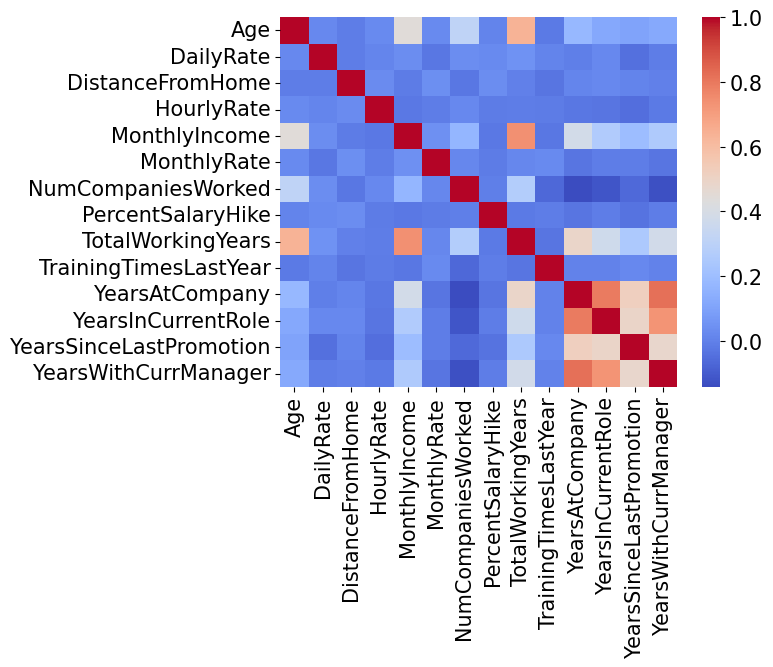

In [22]:
#Pearson corr
sns.heatmap(data.corr(),cmap='coolwarm')

##  Monthly Income vs. Numeric Features: Non-Parametric Test 

In [23]:
#Testing Association between monthly income and all numerical variables (via Spearman correlation)
from scipy import stats

quantitative_columns = data.select_dtypes(include=['int64', 'float64']).columns.drop(['MonthlyIncome'])

for i in quantitative_columns:
    print(f'Monthly Income : {i}')
    corr_spearman, p_spearman = stats.spearmanr(data[i], data.MonthlyIncome)

    print("Spearman correlation coefficient:", corr_spearman)
    print("p-value:", p_spearman)
    if (p_spearman<=0.05) & (corr_spearman>=0.8): print(f"\033[1m THERE EXISTS AN ASSOCIATION \033[0m")


    print('\n')

Monthly Income : Age
Spearman correlation coefficient: 0.4211938379825417
p-value: 9.372158362158977e-61


Monthly Income : DailyRate
Spearman correlation coefficient: 0.030022406971423176
p-value: 0.26384396402911814


Monthly Income : DistanceFromHome
Spearman correlation coefficient: 0.00700517709636337
p-value: 0.7943563118751447


Monthly Income : HourlyRate
Spearman correlation coefficient: -0.026402164740419773
p-value: 0.3258210747792727


Monthly Income : MonthlyRate
Spearman correlation coefficient: 0.05948227925661855
p-value: 0.02674427785811712


Monthly Income : NumCompaniesWorked
Spearman correlation coefficient: 0.19810550750404088
p-value: 9.680570578736318e-14


Monthly Income : PercentSalaryHike
Spearman correlation coefficient: -0.02585559938130621
p-value: 0.33593984805158916


Monthly Income : TotalWorkingYears
Spearman correlation coefficient: 0.6724817101584345
p-value: 3.0300875816917044e-183


Monthly Income : TrainingTimesLastYear
Spearman correlation coeffic

<AxesSubplot: >

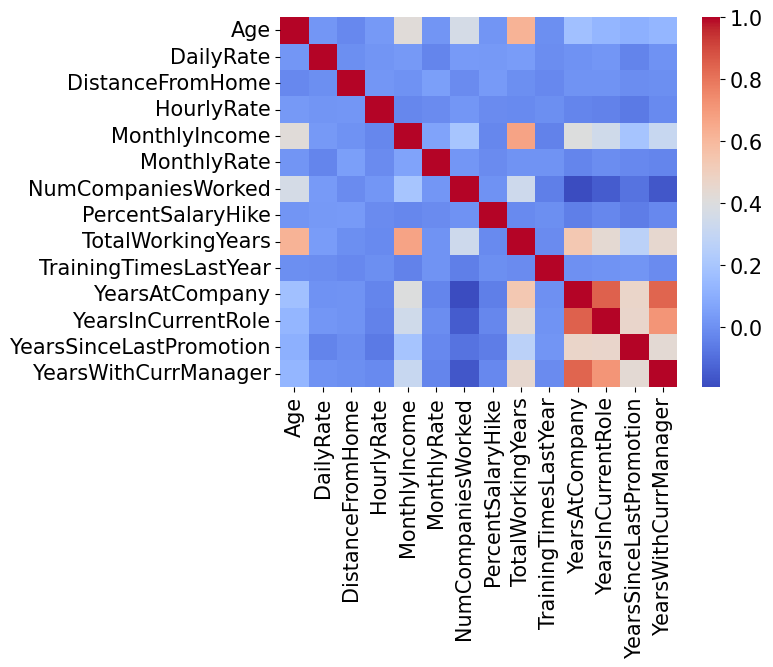

In [24]:
#Spearman corr
sns.heatmap(data.corr("spearman"),cmap='coolwarm')

##  Monthly Income vs. Categorical Features: Parametric Test 

In [25]:
#Testing Association between monthly income and all categorical variables (via ANOVA test & t-test)
from scipy import stats

categorical_variables = data.select_dtypes(include=['object', 'string'])

for i in categorical_variables.columns:
    print(f'Monthly Income : {i}')
    groups=data.groupby(i)['MonthlyIncome']
    if len(data[i].unique()) >2:
        f_value, p_value = stats.f_oneway(*[group for _, group in groups])
        print("F-value:", f_value)
        print("p-value:", p_value)
        if p_value<=0.05: print(f"\033[1m THERE EXISTS AN ASSOCIATION \033[0m")
    else:
        t_value, p_value = stats.ttest_ind(*[group for _, group in groups], alternative='less')
        print("T-value:", t_value)
        print("p-value:", p_value)
        if p_value<=0.05: print(f"\033[1m THERE EXISTS AN ASSOCIATION \033[0m")

    print('\n')

Monthly Income : Attrition
T-value: 6.103744707415117
p-value: 0.999999999328612


Monthly Income : BusinessTravel
F-value: 1.0570911855741603
p-value: 0.34774542413465453


Monthly Income : Department
F-value: 3.903041140149806
p-value: 0.020402959328092246
 THERE EXISTS AN ASSOCIATION 


Monthly Income : Education
F-value: 2.0655416147130317
p-value: 0.08305411229513227


Monthly Income : EducationField
F-value: 1.8122901421126805
p-value: 0.10741427539265161


Monthly Income : EnvironmentSatisfaction
F-value: 0.36281399879178267
p-value: 0.779873362685118


Monthly Income : Gender
T-value: 1.7645917453951077
p-value: 0.9610736062785871


Monthly Income : JobInvolvement
F-value: 0.5543176427717544
p-value: 0.6452906071726869


Monthly Income : JobLevel
F-value: 3466.307422582188
p-value: 0.0
 THERE EXISTS AN ASSOCIATION 


Monthly Income : JobRole
F-value: 646.7664364489076
p-value: 0.0
 THERE EXISTS AN ASSOCIATION 


Monthly Income : JobSatisfaction
F-value: 0.16689285133459844
p-va

Using pearson & spearman correlation Monthly Income is not associates with any numerical variable


For categorical variable Monthly Income is associated with: Department, JobLevel, JobRole, MaritalStatus, and StockOptionLevel


# Collinearity

In [26]:
Correlated=[]

## Dependency(collinearlity) between two numericals features

In [27]:
#Testing association between numerocal variables (via spearman correlation)
from scipy import stats

quantitative_columns = data.select_dtypes(include=['int64', 'float64'])
I=[]
for i in quantitative_columns:
    I.append(i)
    for j in quantitative_columns.drop(I,axis=1):
        corr_spearman, p_spearman = stats.spearmanr(data[i], data[j])
        if (p_spearman<=0.05) & (corr_spearman>=0.8):
            print(f'{i} : {j} \033[1m THERE EXISTS AN ASSOCIATION \033[0m')
            print("Spearman correlation coefficient:", corr_spearman)
            print("p-value:", p_spearman)
            print('\n')
            Correlated.append([i,j])

YearsAtCompany : YearsInCurrentRole  THERE EXISTS AN ASSOCIATION 
Spearman correlation coefficient: 0.8464596001957851
p-value: 0.0


YearsAtCompany : YearsWithCurrManager  THERE EXISTS AN ASSOCIATION 
Spearman correlation coefficient: 0.83797058971467
p-value: 0.0




<AxesSubplot: >

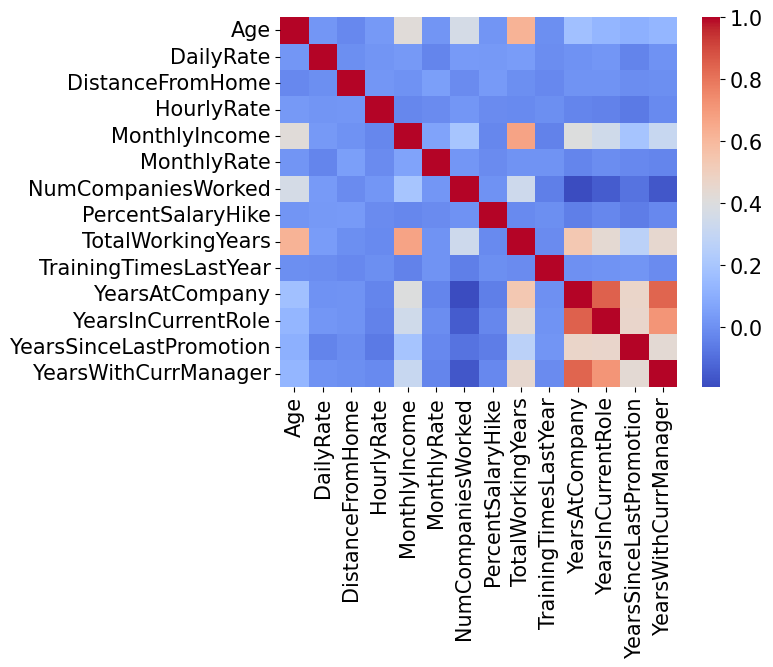

In [28]:
#Spearman corr
sns.heatmap(data.corr("spearman"),cmap='coolwarm')

## Dependency(collinearlity) between  numericals & categorical features

In [29]:
## Dependency(collinearlity) between two numericals features#Testing association between numerical variables and categorical (via ANOVA & t-test)
from scipy import stats

quantitative_columns = data.select_dtypes(include=['int64', 'float64'])
categorical_variables = data.select_dtypes(include=['object', 'string'])

for i in quantitative_columns:
    for j in categorical_variables:
        groups=data.groupby(j)[i]
        
        if len(data[j].unique()) >2: #Anova test
            f_value, p_value = stats.f_oneway(*[group for _, group in groups])
            if (p_value<=0.05):
                print(f'{i} : {j} \033[1m THERE EXISTS AN ASSOCIATION \033[0m')
                print("F-value:", f_value)
                print("p-value:", p_value)
                print('\n')
                Correlated.append([i,j])
        else: #t-test
            t_value, p_value = stats.ttest_ind(*[group for _, group in groups], alternative='less')
            if (p_value<=0.05):
                print(f'{i} : {j} \033[1m THERE EXISTS AN ASSOCIATION \033[0m')
                print("T-value:", t_value)
                print("p-value:", p_value)
                print('\n')
                Correlated.append([i,j])


Age : Education  THERE EXISTS AN ASSOCIATION 
F-value: 20.131147306324245
p-value: 3.9476062053003457e-16


Age : JobLevel  THERE EXISTS AN ASSOCIATION 
F-value: 93.24447861497481
p-value: 2.945646336011241e-70


Age : JobRole  THERE EXISTS AN ASSOCIATION 
F-value: 30.045123768728416
p-value: 1.4330995664450589e-43


Age : MaritalStatus  THERE EXISTS AN ASSOCIATION 
F-value: 12.055429124741709
p-value: 6.448755836902304e-06


Age : StockOptionLevel  THERE EXISTS AN ASSOCIATION 
F-value: 5.713672983920431
p-value: 0.0006928842554512146


DailyRate : MaritalStatus  THERE EXISTS AN ASSOCIATION 
F-value: 4.523889885378422
p-value: 0.011007628467930053


DistanceFromHome : Attrition  THERE EXISTS AN ASSOCIATION 
T-value: -3.054031806786514
p-value: 0.0011504753075394197


DistanceFromHome : JobLevel  THERE EXISTS AN ASSOCIATION 
F-value: 4.519210351435814
p-value: 0.001249399301036654


DistanceFromHome : StockOptionLevel  THERE EXISTS AN ASSOCIATION 
F-value: 4.096468854548633
p-value: 0.0

## Dependency(collinearlity) between two categorical features

In [30]:
## Dependency(collinearlity) between two numericals features#Testing association between categorical variables (via CHI-SQUARE)
from scipy.stats import chi2_contingency

categorical_variables = data.select_dtypes(include=['object', 'string'])
I=[]
for i in categorical_variables:
    I.append(i)
    for j in categorical_variables.drop(I,axis=1):
        groups= pd.crosstab(data[i], data[j])
        statistic, p_value, dof, expected = chi2_contingency(groups)
        if (p_value<=0.05):
            print(f'{i} : {j} \033[1m THERE EXISTS AN ASSOCIATION \033[0m')
            print("Chi-square test statistic:", statistic)
            print("p-value:", p_value)
            print('\n')
            Correlated.append([i,j])


Attrition : BusinessTravel  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 23.23096941113605
p-value: 9.025246820675197e-06


Attrition : Department  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 11.299244271013514
p-value: 0.003518846170755682


Attrition : EducationField  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 14.505318628056225
p-value: 0.01269898080085869


Attrition : EnvironmentSatisfaction  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 25.615621126349687
p-value: 1.1478586511020012e-05


Attrition : JobInvolvement  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 27.28422022193983
p-value: 5.132453737113668e-06


Attrition : JobLevel  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 68.21802826174596
p-value: 5.395876665278101e-14


Attrition : JobRole  THERE EXISTS AN ASSOCIATION 
Chi-square test statistic: 82.15884688982281
p-value: 1.795717418076296e-14


Attrition : JobSatisfaction  THERE EXISTS AN ASSOCIATION 
Chi-

In [31]:
#All corrolated variables
Correlated=pd.DataFrame(Correlated).sort_values(by=0).reset_index(drop=True).drop_duplicates()
Correlated

,0,1
0,Age,Education
1,Age,JobLevel
2,Age,JobRole
3,Age,MaritalStatus
4,Age,StockOptionLevel
...,...,...
64,YearsSinceLastPromotion,JobLevel
65,YearsWithCurrManager,RelationshipSatisfaction
66,YearsWithCurrManager,JobRole
67,YearsWithCurrManager,JobLevel


In [32]:
count_1 = Correlated.groupby(1)[0].count()
count_0 = Correlated.groupby(0)[1].count()

sum_counts = count_1.add(count_0, fill_value=0).sort_values(ascending=False)
sum_counts


JobRole                     15.0
JobLevel                    15.0
Attrition                   14.0
MaritalStatus               10.0
StockOptionLevel             9.0
Department                   6.0
Education                    6.0
Age                          5.0
YearsInCurrentRole           5.0
YearsAtCompany               5.0
TotalWorkingYears            5.0
NumCompaniesWorked           5.0
MonthlyIncome                5.0
YearsWithCurrManager         5.0
EducationField               5.0
YearsSinceLastPromotion      4.0
RelationshipSatisfaction     3.0
DistanceFromHome             3.0
WorkLifeBalance              2.0
JobSatisfaction              2.0
JobInvolvement               1.0
HourlyRate                   1.0
Gender                       1.0
EnvironmentSatisfaction      1.0
OverTime                     1.0
PercentSalaryHike            1.0
PerformanceRating            1.0
DailyRate                    1.0
BusinessTravel               1.0
dtype: float64

In [33]:
#data.drop('JobRole',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [34]:
#data.drop('JobLevel',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [35]:
#data.drop('Attrition',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [36]:
#data.drop('MaritalStatus',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [37]:
#data.drop('StockOptionLevel',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [38]:
#data.drop('Education',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [39]:
#data.drop('Department',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [40]:
#data.drop('YearsAtCompany',axis=1,inplace=True) #run 6 previous cells again to check for correlations

In [41]:
#data.drop(['OverTime','JobSatisfaction','PercentSalaryHike','RelationshipSatisfaction'],axis=1,inplace=True)

To address the collinearity issue, 
The final model was tested while droping all, none, and top 5 collinear variable. And the best result was achieved upon not dropping anything so all variables were kept. 

# Implement Tree-based regression techniques, such as Simple Tree, Random Forest (RF), Gradient Boosting Machine (GBM), and Extreme Gradient Boosting (XGB), to model employee monthly income, optimizing the model's parameters using 10-fold cross-validation and train data set (select only four parameters using your own intuition).

# And Discuss the sensitivity of the model's performance to those parameters

In [42]:
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [43]:
#Selecting data
X=data.drop('MonthlyIncome',axis=1)
y=data['MonthlyIncome']

In [44]:
X

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,College,Life_Sciences,Medium,Female,94,High,2,Sales_Executive,Very_High,Single,19479,8,Yes,11,Excellent,Low,0,8,0,Bad,6,4,0,5
1,49,No,Travel_Frequently,279,Research_Development,8,Below_College,Life_Sciences,High,Male,61,Medium,2,Research_Scientist,Medium,Married,24907,1,No,23,Outstanding,Very_High,1,10,3,Better,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research_Development,2,College,Other,Very_High,Male,92,Medium,1,Laboratory_Technician,High,Single,2396,6,Yes,15,Excellent,Medium,0,7,3,Better,0,0,0,0
3,33,No,Travel_Frequently,1392,Research_Development,3,Master,Life_Sciences,Very_High,Female,56,High,1,Research_Scientist,High,Married,23159,1,Yes,11,Excellent,High,0,8,3,Better,8,7,3,0
4,27,No,Travel_Rarely,591,Research_Development,2,Below_College,Medical,Low,Male,40,High,1,Laboratory_Technician,Medium,Married,16632,9,No,12,Excellent,Very_High,1,6,3,Better,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,No,Travel_Frequently,884,Research_Development,23,College,Medical,High,Male,41,Very_High,2,Laboratory_Technician,Very_High,Married,12290,4,No,17,Excellent,High,1,17,3,Better,5,2,0,3
1383,39,No,Travel_Rarely,613,Research_Development,6,Below_College,Medical,Very_High,Male,42,Medium,3,Healthcare_Representative,Low,Married,21457,4,No,15,Excellent,Low,1,9,5,Better,7,7,1,7
1384,27,No,Travel_Rarely,155,Research_Development,4,Bachelor,Life_Sciences,Medium,Male,87,Very_High,2,Manufacturing_Director,Medium,Married,5174,1,Yes,20,Outstanding,Medium,1,6,0,Better,6,2,0,3
1385,49,No,Travel_Frequently,1023,Sales,2,Bachelor,Medical,Very_High,Male,63,Medium,2,Sales_Executive,Medium,Married,13243,2,No,14,Excellent,Very_High,0,17,3,Good,9,6,0,8


In [45]:
X = pd.get_dummies(X)
X

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_No,Attrition_Yes,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human_Resources,Department_Research_Development,Department_Sales,Education_Bachelor,Education_Below_College,Education_College,Education_Doctor,Education_Master,EducationField_Human_Resources,EducationField_Life_Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical_Degree,EnvironmentSatisfaction_High,EnvironmentSatisfaction_Low,EnvironmentSatisfaction_Medium,EnvironmentSatisfaction_Very_High,Gender_Female,Gender_Male,JobInvolvement_High,JobInvolvement_Low,JobInvolvement_Medium,JobInvolvement_Very_High,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobRole_Healthcare_Representative,JobRole_Human_Resources,JobRole_Laboratory_Technician,JobRole_Manager,JobRole_Manufacturing_Director,JobRole_Research_Director,JobRole_Research_Scientist,JobRole_Sales_Executive,JobRole_Sales_Representative,JobSatisfaction_High,JobSatisfaction_Low,JobSatisfaction_Medium,JobSatisfaction_Very_High,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes,PerformanceRating_Excellent,PerformanceRating_Outstanding,RelationshipSatisfaction_High,RelationshipSatisfaction_Low,RelationshipSatisfaction_Medium,RelationshipSatisfaction_Very_High,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_Bad,WorkLifeBalance_Best,WorkLifeBalance_Better,WorkLifeBalance_Good
0,41,1102,1,94,19479,8,11,8,0,6,4,0,5,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0
1,49,279,8,61,24907,1,23,10,3,10,7,1,7,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0
2,37,1373,2,92,2396,6,15,7,3,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,1,0
3,33,1392,3,56,23159,1,11,8,3,8,7,3,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,1,0
4,27,591,2,40,16632,9,12,6,3,2,2,2,2,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,884,23,41,12290,4,17,17,3,5,2,0,3,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0
1383,39,613,6,42,21457,4,15,9,5,7,7,1,7,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0
1384,27,155,4,87,5174,1,20,6,0,6,2,0,3,1,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1385,49,1023,2,63,13243,2,14,17,3,9,6,0,8,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1


In [46]:
#Split the data into training and testing (20% testing, 80% training)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3)

In [47]:
#Define Mean Absolute Percent Error (MAPE) function
def MAPE(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [48]:
#Define function to evaluate performance of different models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate(model, Y_test, X_test,X_train,Y_train): 

    # MSE Score on train dataset
    mse_train = mean_squared_error(y_train, model.predict(X_train))
    print('MSE on train dataset : ', round(mse_train,2))

    # MSE on test dataset
    mse_test = mean_squared_error(y_test, model.predict(X_test))
    print('MSE on test dataset : ', round(mse_test,2), '\n')
    
    rmse = np.sqrt(mse_test)
    mae = mean_absolute_error(y_test, model.predict(X_test))
    r2 = r2_score(y_test, model.predict(X_test))
    mape= MAPE(y_test, model.predict(X_test))

    print('Model Performance - Testing Data')
    print('RMSE: {}'.format(round(rmse,2)))
    print('MAE: {}'.format(round(mae,2)))
    print('R-Sqaure: {}'.format(round(r2,2)))
    print('MAPE: {}'.format(round(mape,2)))


### Simple Tree

In [49]:
#Simple tree
model1 = DecisionTreeRegressor(random_state=2)
model1.fit(X_train,y_train)
evaluate(model1, y_test, X_test,X_train,y_train)

print('\nParameters: \n',model1.get_params(),'\n\nDepth:',model1.get_depth(),'\n\nNo. of leaf nodes:',model1.get_n_leaves())

MSE on train dataset :  0.0
MSE on test dataset :  2001778.78 

Model Performance - Testing Data
RMSE: 1414.84
MAE: 1024.89
R-Sqaure: 0.89
MAPE: 21.63

Parameters: 
 {'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 2, 'splitter': 'best'} 

Depth: 26 

No. of leaf nodes: 1106


In [50]:
#Hyperparameter-tuning

param_grid = {
    'max_depth': [None,1,2,3,4,5,6,7,8,9,10,20],
    'min_samples_leaf': [20,25,30,35],
    'min_samples_split': [2,3,4,5],
    'max_leaf_nodes' : [None,250,500,750]
}

model1 = GridSearchCV(estimator = DecisionTreeRegressor(random_state=2), param_grid = param_grid, scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
model1.fit(X_train, y_train)
evaluate(model1, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model1.best_params_)

MSE on train dataset :  1846181.3
MSE on test dataset :  3847174.46 

Model Performance - Testing Data
RMSE: 1961.42
MAE: 1150.06
R-Sqaure: 0.78
MAPE: 20.82

Parameters: 
 {'max_depth': 6, 'max_leaf_nodes': None, 'min_samples_leaf': 25, 'min_samples_split': 2}


[Text(0.6941964285714286, 0.9285714285714286, 'TotalWorkingYears <= 20.5\nsquared_error = 18186591.072\nsamples = 1109\nvalue = 6046.142'),
 Text(0.45982142857142855, 0.7857142857142857, 'JobLevel_3 <= 0.5\nsquared_error = 7442399.773\nsamples = 998\nvalue = 4974.494'),
 Text(0.20535714285714285, 0.6428571428571429, 'JobLevel_1 <= 0.5\nsquared_error = 3669844.422\nsamples = 855\nvalue = 4174.344'),
 Text(0.07142857142857142, 0.5, 'TotalWorkingYears <= 5.5\nsquared_error = 2883090.014\nsamples = 426\nvalue = 5577.622'),
 Text(0.03571428571428571, 0.35714285714285715, 'squared_error = 197712.273\nsamples = 47\nvalue = 4474.638'),
 Text(0.10714285714285714, 0.35714285714285715, 'JobRole_Laboratory_Technician <= 0.5\nsquared_error = 3046528.067\nsamples = 379\nvalue = 5714.404'),
 Text(0.07142857142857142, 0.21428571428571427, 'JobRole_Research_Scientist <= 0.5\nsquared_error = 3049267.799\nsamples = 333\nvalue = 5877.42'),
 Text(0.03571428571428571, 0.07142857142857142, 'squared_error = 3

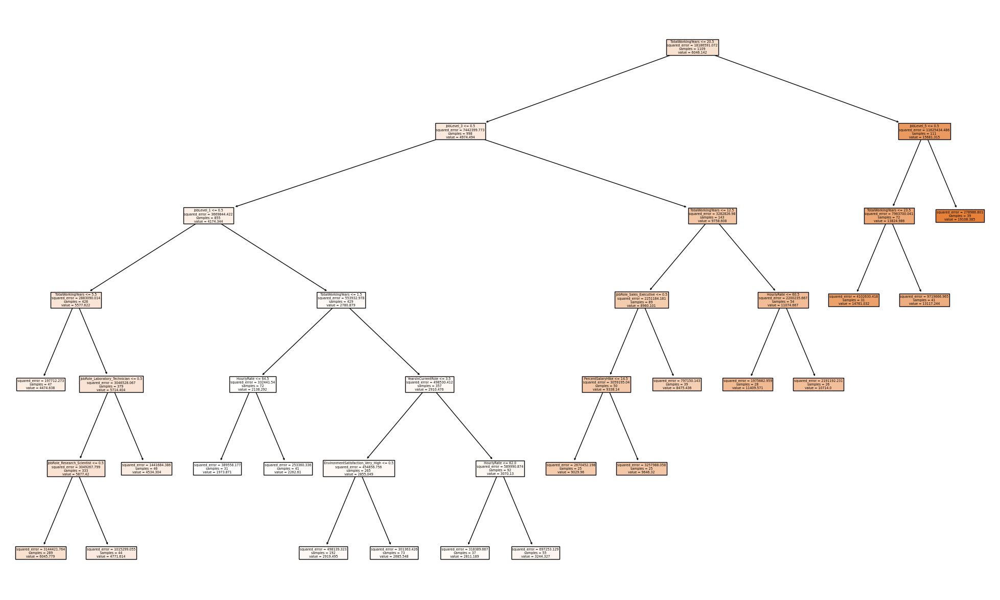

In [51]:
fig = plt.figure(figsize=(25,15))
plot_tree(model1.best_estimator_,feature_names=X_train.columns,filled=True)

In [52]:
#Sensitivity Analysis
param=['param_max_depth','param_min_samples_leaf', 'param_min_samples_split','param_max_leaf_nodes']

par_grid=[]
par_grid.append ( {
    'max_depth': [1,2,3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
    'min_samples_leaf': [30],
    'min_samples_split': [2],
    'max_leaf_nodes' : [None]})

par_grid.append ({
    'max_depth': [3],
    'min_samples_leaf': [None,5,10,15,20,25,30,35,40,45,50],
    'min_samples_split': [2],
    'max_leaf_nodes' : [None]})

par_grid.append ({
    'max_depth': [3],
    'min_samples_leaf': [30],
    'min_samples_split': [1,2,3,4,5,6,7,8,9,10],
    'max_leaf_nodes' : [None]})

par_grid.append ({
    'max_depth': [3],
    'min_samples_leaf': [30],
    'min_samples_split': [2],
    'max_leaf_nodes' : [None,10,25,50,100,150,250,500,750,1000]})


PARAM_MAX_DEPTH


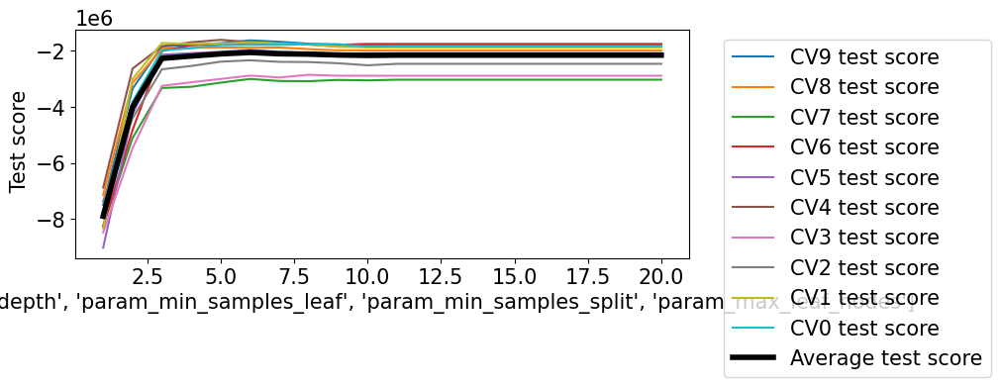

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


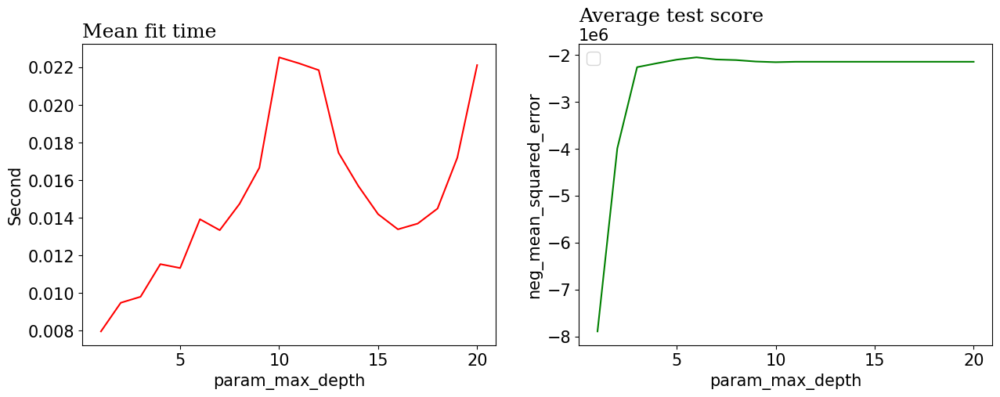

PARAM_MIN_SAMPLES_LEAF


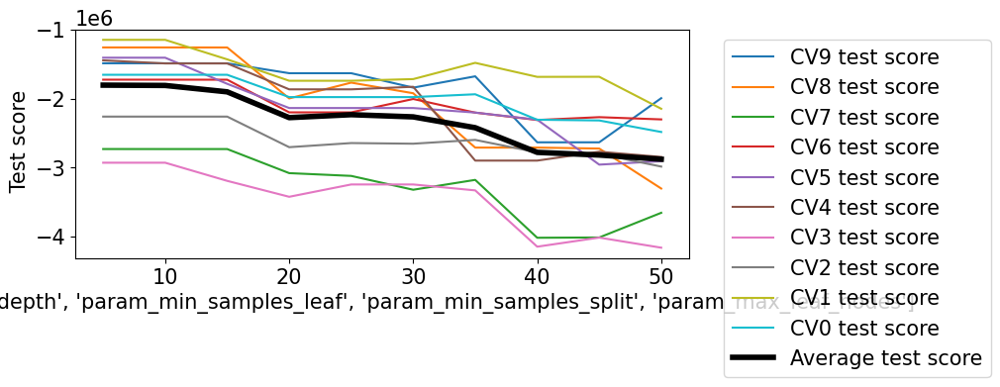

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


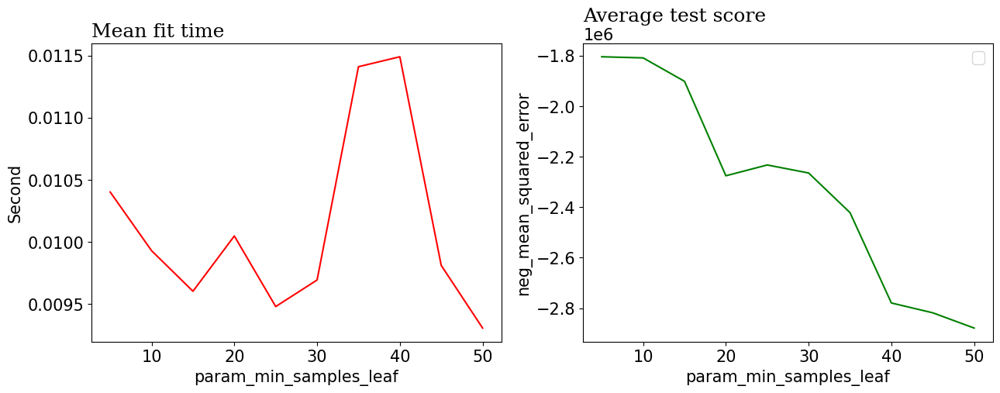

PARAM_MIN_SAMPLES_SPLIT


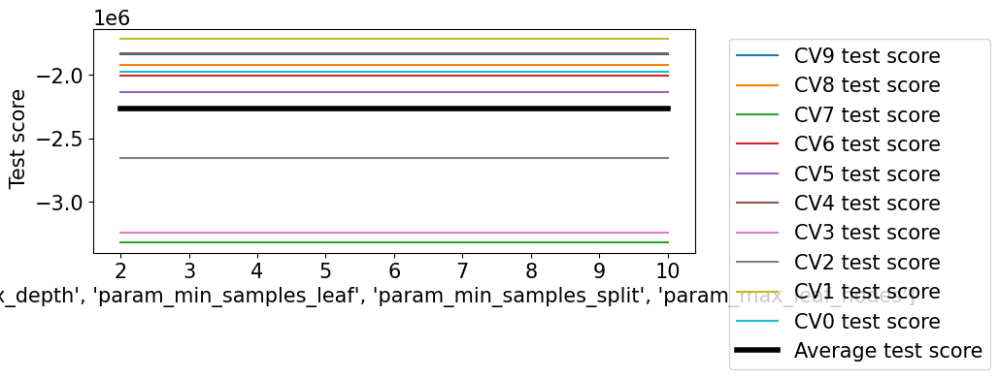

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


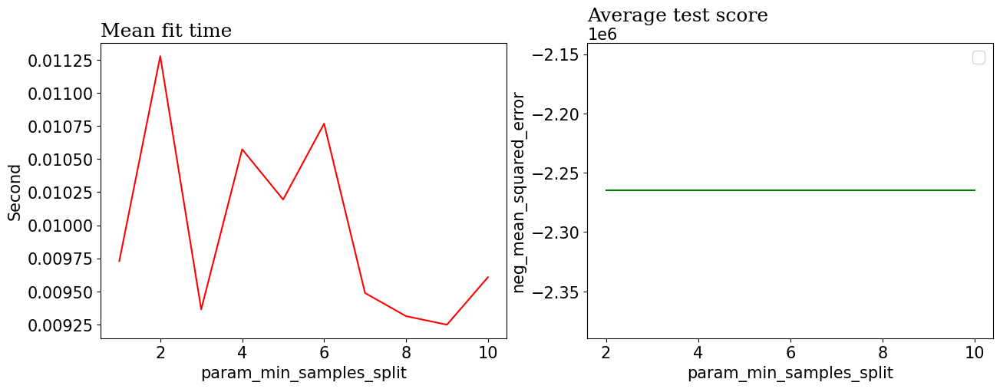

PARAM_MAX_LEAF_NODES


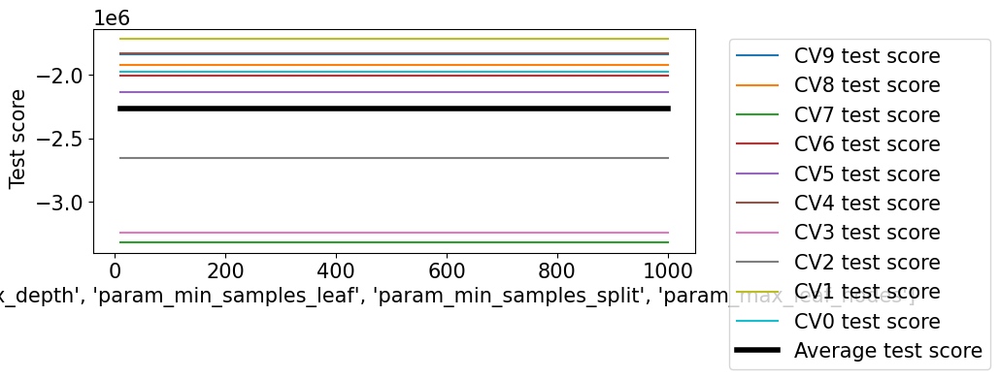

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


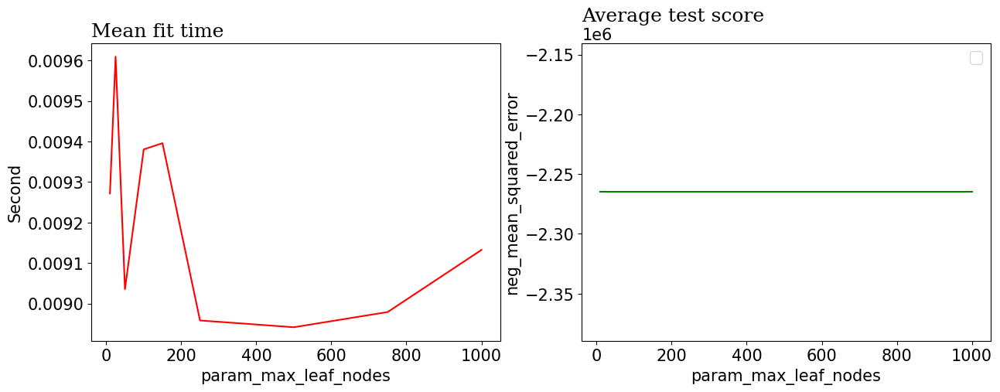

In [53]:
for (p,pg) in zip(param,par_grid):
    
    tree_cv = GridSearchCV(estimator = DecisionTreeRegressor(random_state=2), param_grid = pg, scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
    tree_cv.fit(X_train, y_train)

    df_sensetivity = pd.DataFrame(tree_cv.cv_results_)

    print(p.upper())
    plt.figure(figsize=(8,3))
    plt.plot(df_sensetivity[p],df_sensetivity['split9_test_score'], label="CV9 test score ")
    plt.plot(df_sensetivity[p],df_sensetivity['split8_test_score'], label="CV8 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split7_test_score'], label="CV7 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split6_test_score'], label="CV6 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split5_test_score'], label="CV5 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split4_test_score'], label="CV4 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split3_test_score'], label="CV3 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split2_test_score'], label="CV2 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split1_test_score'], label="CV1 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split0_test_score'], label="CV0 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['mean_test_score'], label="Average test score",color='black', linewidth=4)
    plt.xlabel(param)
    plt.ylabel(" Test score")
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show();

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.plot(df_sensetivity[p],df_sensetivity['mean_fit_time'],color='red')
    ax1.set_title('Mean fit time', fontfamily='serif', loc='left', fontsize='large')
    ax1.set(xlabel=p, ylabel='Second')

    ax2.plot(df_sensetivity[p],df_sensetivity['mean_test_score'],color='green')
    ax2.set_title('Average test score', fontfamily='serif', loc='left', fontsize='large')
    ax2.set(xlabel=p, ylabel='neg_mean_squared_error')

    plt.legend()
    plt.show();

Upon changing few parameters of the refined model, the model is only sensitive to:

(1) depth of tree: As the depth increases beyond 3, the performance of the model increase, however it can also mean that the model is overfitting.

(2) Minimum number of samples required to be at a leaf node change from 0-50 we can see a significant drop in the performance of the model. This can be because we are adding additional constraints to avoid overfitting and hence the performance decreases as the condition becomes more restrictive. 

The minimum number of samples required to split an internal node in the tree & the maximum number of leaf nodes in a decision tree dont change the models performace much.

### Random Forest

In [54]:
#Random forest
model2 = RandomForestRegressor(random_state=2)
model2.fit(X_train,y_train)
evaluate(model2, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model2.get_params())

MSE on train dataset :  159529.83
MSE on test dataset :  1121044.41 

Model Performance - Testing Data
RMSE: 1058.79
MAE: 784.47
R-Sqaure: 0.94
MAPE: 17.78

Parameters: 
 {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 2, 'verbose': 0, 'warm_start': False}


In [55]:
#Hyper-tuning
param_grid = {
    'max_depth': [None,2,4,5,6],
    'max_features': [None,5,10,15,20,30],
    'n_estimators': [150,200,250,300],
    'bootstrap': [True,False]
    }
model2 = GridSearchCV(estimator = RandomForestRegressor(random_state=2), param_grid = param_grid,  scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
model2.fit(X_train, y_train)
evaluate(model2, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model2.best_params_)

MSE on train dataset :  850890.06
MSE on test dataset :  1076687.03 

Model Performance - Testing Data
RMSE: 1037.64
MAE: 764.82
R-Sqaure: 0.94
MAPE: 17.36

Parameters: 
 {'bootstrap': True, 'max_depth': 6, 'max_features': None, 'n_estimators': 300}


In [56]:
#Sensitivity Analysis
param=['param_max_depth','param_max_features', 'param_n_estimators','param_bootstrap']

par_grid=[]
par_grid.append ( {
    'max_depth': [None,1,2,3,4,5,6,8,10,15,20],
    'max_features': [None],
    'n_estimators': [250],
    'bootstrap': [True]
    })

par_grid.append ({
    'max_depth': [4],
    'max_features': [None,2,4,6,8,10,12,14,16,18,20,30],
    'n_estimators': [250],
    'bootstrap': [True]
    })

par_grid.append ({
    'max_depth': [4],
    'max_features': [None],
    'n_estimators': [25,50,100,150,200,250,300,350],
    'bootstrap': [True]
    })

par_grid.append ({
    'max_depth': [4],
    'max_features': [None],
    'n_estimators': [250],
    'bootstrap': [True,False]
    })

PARAM_MAX_DEPTH


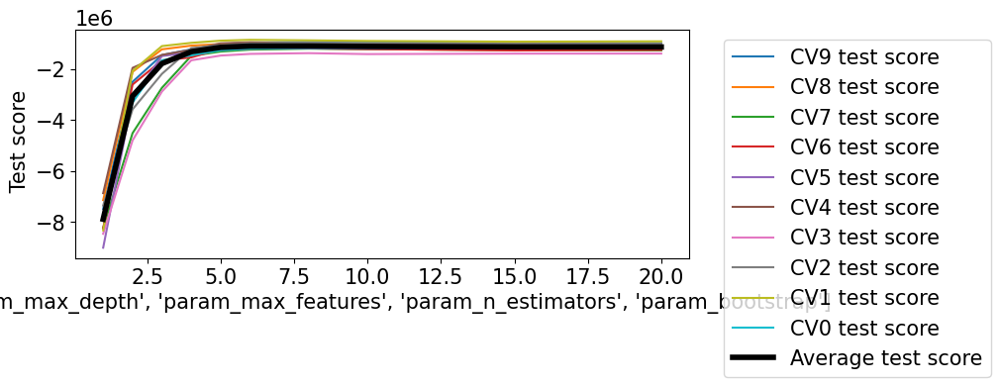

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


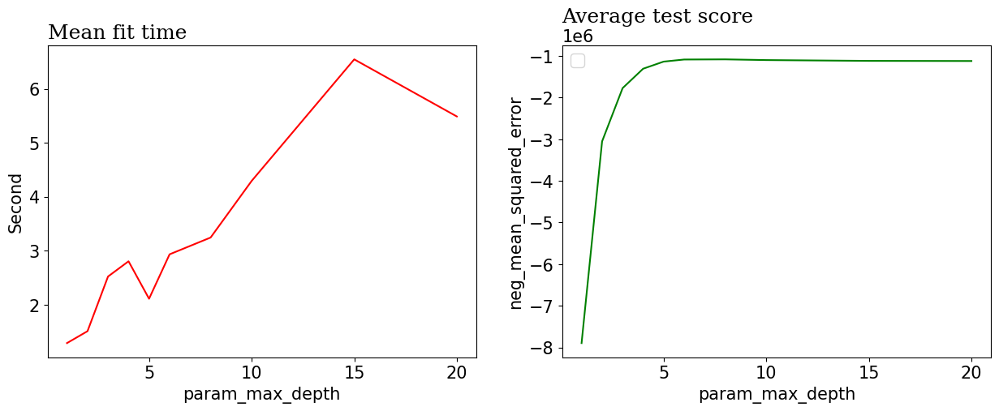

PARAM_MAX_FEATURES


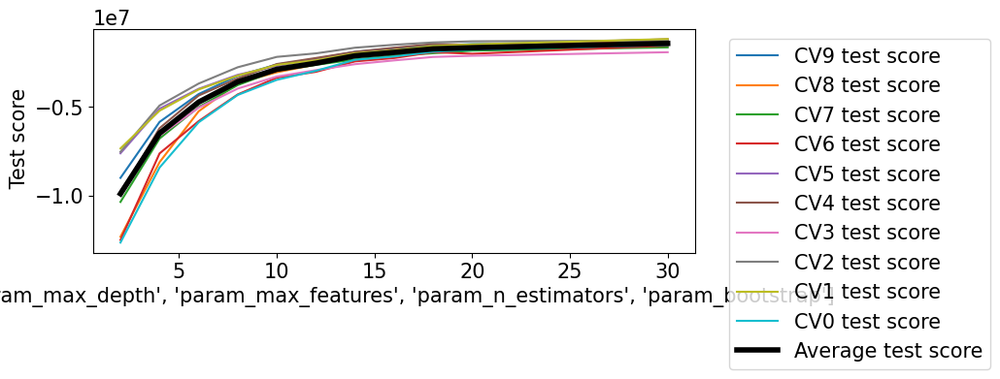

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


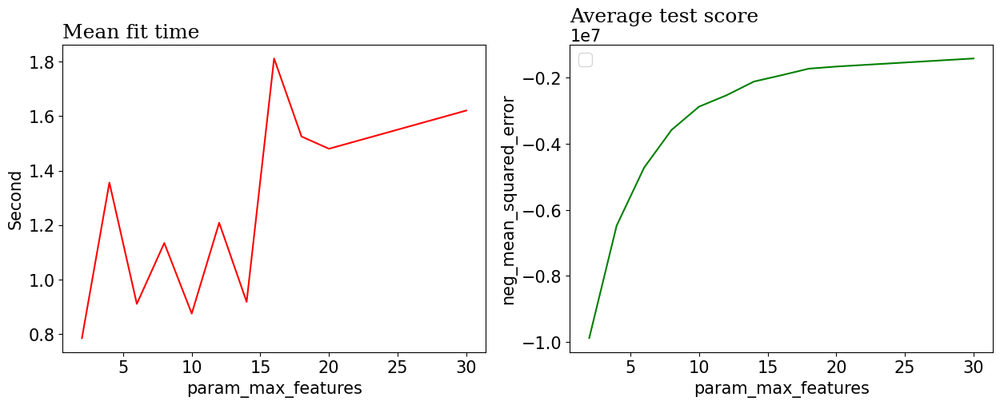

PARAM_N_ESTIMATORS


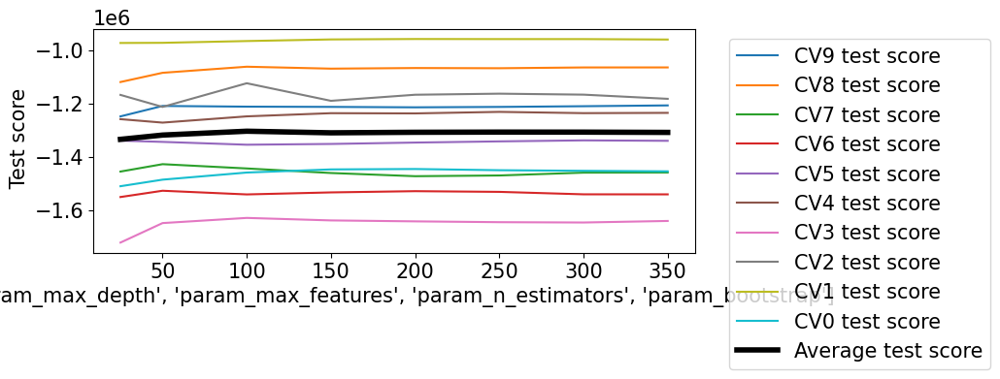

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


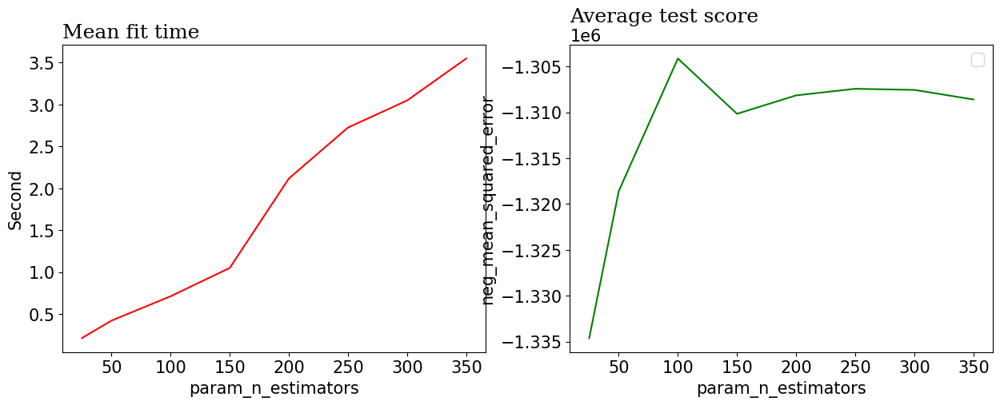

PARAM_BOOTSTRAP


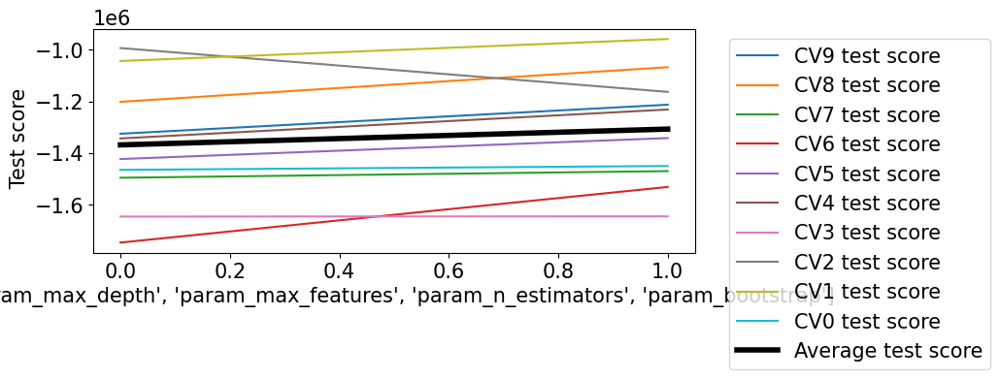

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


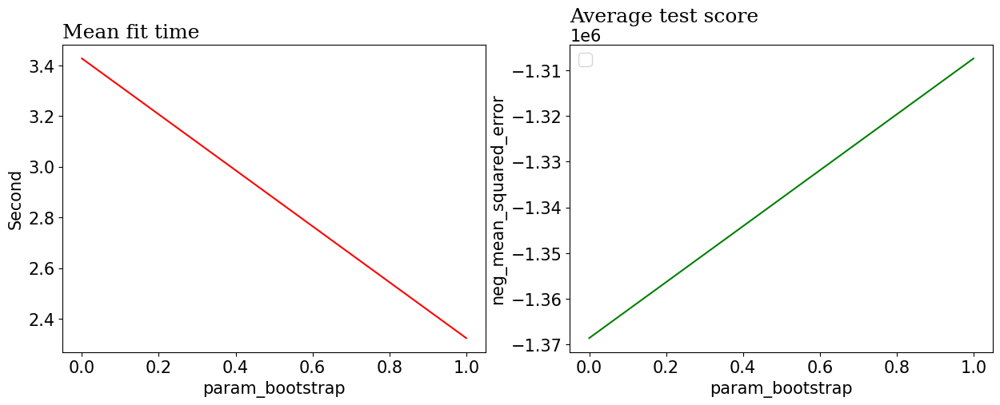

In [57]:
for (p,pg) in zip(param,par_grid):
    
    tree_cv = GridSearchCV(estimator = RandomForestRegressor(random_state=2), param_grid = pg, scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
    tree_cv.fit(X_train, y_train)

    df_sensetivity = pd.DataFrame(tree_cv.cv_results_)

    print(p.upper())
    plt.figure(figsize=(8,3))
    plt.plot(df_sensetivity[p],df_sensetivity['split9_test_score'], label="CV9 test score ")
    plt.plot(df_sensetivity[p],df_sensetivity['split8_test_score'], label="CV8 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split7_test_score'], label="CV7 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split6_test_score'], label="CV6 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split5_test_score'], label="CV5 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split4_test_score'], label="CV4 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split3_test_score'], label="CV3 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split2_test_score'], label="CV2 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split1_test_score'], label="CV1 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split0_test_score'], label="CV0 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['mean_test_score'], label="Average test score",color='black', linewidth=4)
    plt.xlabel(param)
    plt.ylabel(" Test score")
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show();

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.plot(df_sensetivity[p],df_sensetivity['mean_fit_time'],color='red')
    ax1.set_title('Mean fit time', fontfamily='serif', loc='left', fontsize='large')
    ax1.set(xlabel=p, ylabel='Second')

    ax2.plot(df_sensetivity[p],df_sensetivity['mean_test_score'],color='green')
    ax2.set_title('Average test score', fontfamily='serif', loc='left', fontsize='large')
    ax2.set(xlabel=p, ylabel='neg_mean_squared_error')

    plt.legend()
    plt.show();

Upon changing few parameters of the refined model, the model is sensitive to all parameters:

(1) depth of tree: Similar to decision trees, Random forest model is also sensitive to depth, we can see that beyond depth=5, no significant effect is achieved in terms of getting a better fit. Keeping the depth at 5 would help us not overfit.

(2) Number of features (max no. of parameter per split): We can see that with increasing the number of features a better fit can be found with lower MSE, after a point the benefit gets minimal and it is better to settle with lesser number of features and more number of features can also lead to overfitting.

(3) Number of estimators (no. of decision trees): As the number of estimators increase, we can see that a better fit is achieved. However an optimal point can be seen around 100, after which the performance starts decreasing again.

(4) Boostrapping (with or without) : After varying bootstrapping parameter from 0 to 1 we can see that bootstrapping helps improve the performance consistently. 



### Gradient Boosting Machine (GBM)

In [58]:
# Gradient Boosting Machine
model3 = GradientBoostingRegressor(random_state=2)
model3.fit(X_train,y_train)
evaluate(model3, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model3.get_params())

MSE on train dataset :  697426.22
MSE on test dataset :  1212934.69 

Model Performance - Testing Data
RMSE: 1101.33
MAE: 830.2
R-Sqaure: 0.93
MAPE: 18.84

Parameters: 
 {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 2, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [59]:
#Hyper-tuning 
param_grid = {
    "learning_rate": [0.05,0.075,0.1, 0.15, 0.2],
     'min_samples_leaf': [None,10,20,30,50,80,100],
    'max_depth': [None,2,3,5,10,15,20],
    'n_estimators':[25,50,100]}

model3 = GridSearchCV(estimator = GradientBoostingRegressor(random_state=2), param_grid = param_grid, scoring = 'neg_mean_squared_error',cv = 10, n_jobs = -1, verbose = 0)
model3.fit(X_train, y_train)
evaluate(model3, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model3.best_params_)

MSE on train dataset :  955187.43
MSE on test dataset :  1667731.59 

Model Performance - Testing Data
RMSE: 1291.41
MAE: 867.11
R-Sqaure: 0.9
MAPE: 18.88

Parameters: 
 {'learning_rate': 0.05, 'max_depth': 5, 'min_samples_leaf': 30, 'n_estimators': 100}


In [60]:
#Sensitivity Analysis
param=["param_learning_rate",'param_min_samples_leaf', 'param_max_depth','param_n_estimators']

par_grid=[]
par_grid.append ({
    "learning_rate": [0.005,0.01,0.05,0.065,0.075, 0.1,0.15,0.2,0.3,0.5,0.8],
     'min_samples_leaf': [80],
    'max_depth': [2],
    'n_estimators':[50]})

par_grid.append ({
    "learning_rate": [0.075],
     'min_samples_leaf': [None,2,5,10,15,20,25,30,50,80,100,120],
    'max_depth': [2],
    'n_estimators':[25,50,100]})

par_grid.append ({
    "learning_rate": [0.075],
     'min_samples_leaf': [80],
    'max_depth': [1,2,3,4,6,8,10,15,20,25],
    'n_estimators':[50]})

par_grid.append ({
    "learning_rate": [0.075],
     'min_samples_leaf': [80],
    'max_depth': [2],
    'n_estimators':[10,25,50,100,150,200,250,300]})

PARAM_LEARNING_RATE


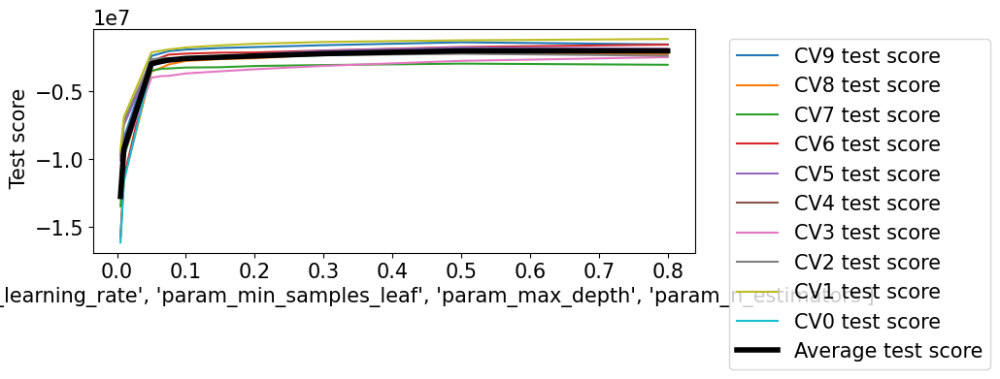

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


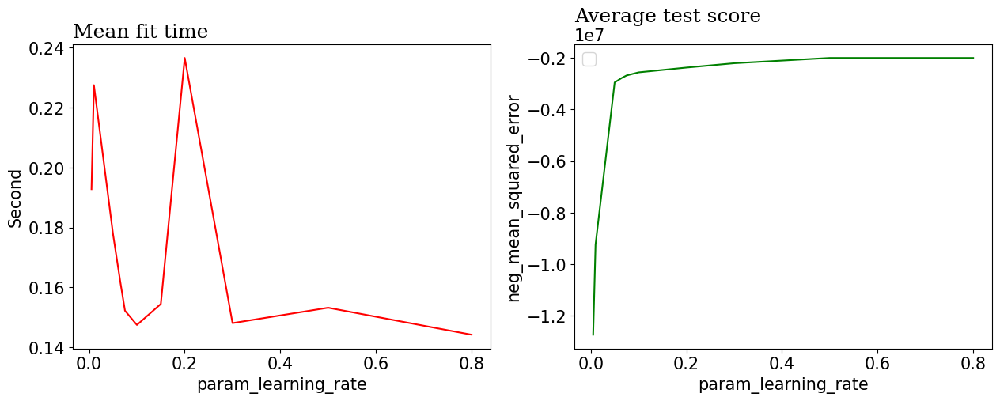

PARAM_MIN_SAMPLES_LEAF


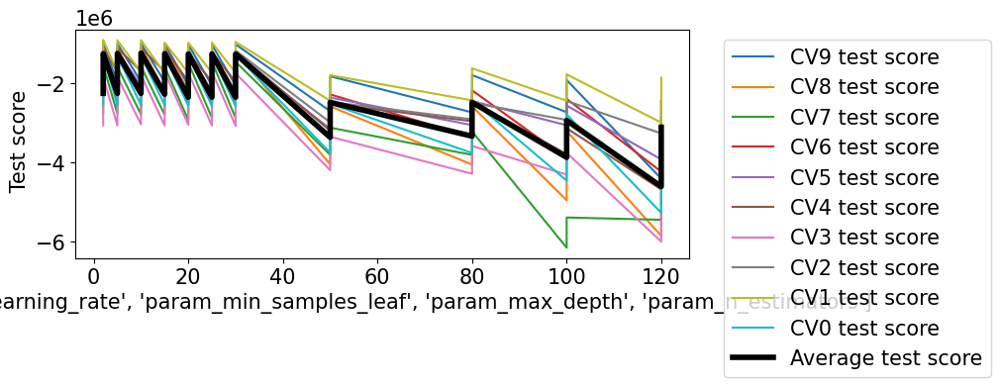

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


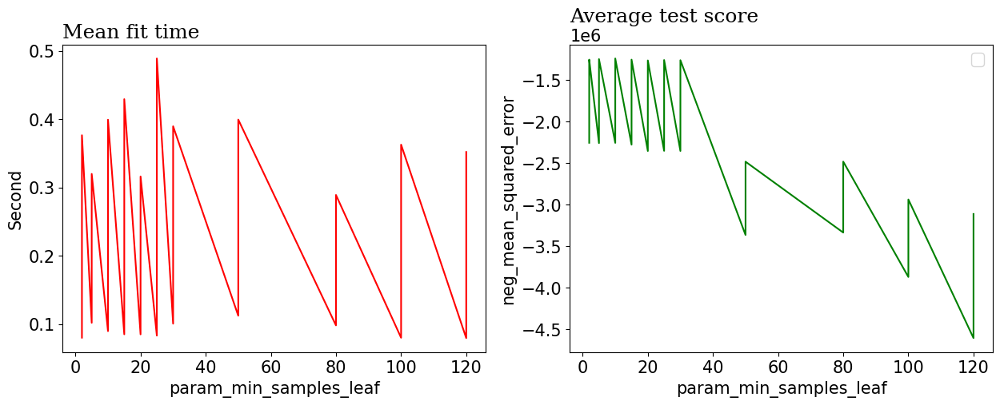

PARAM_MAX_DEPTH


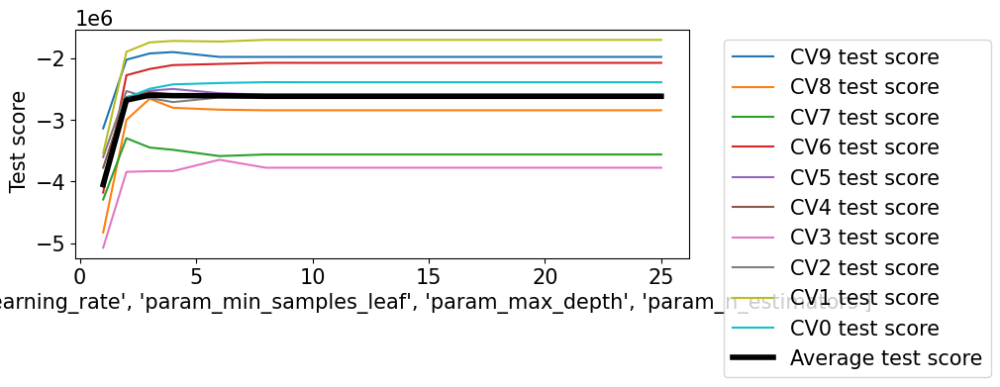

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


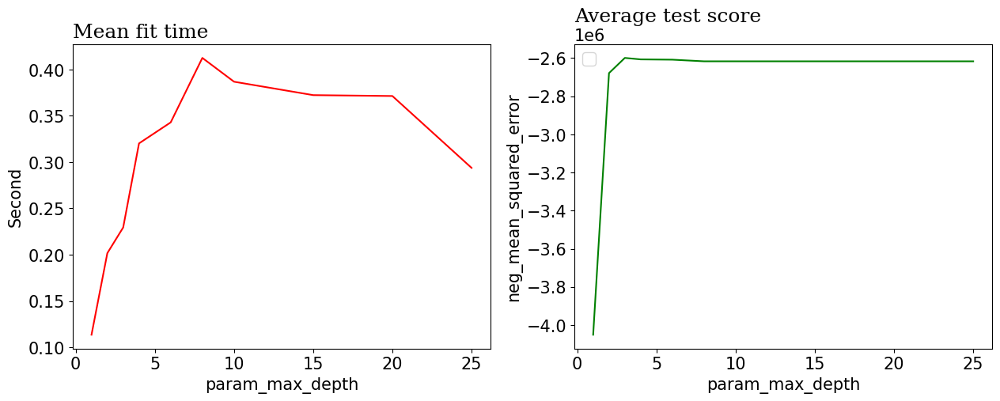

PARAM_N_ESTIMATORS


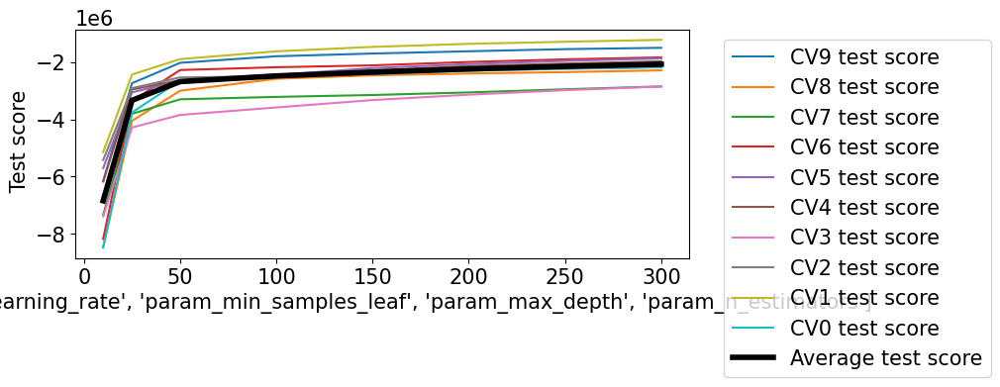

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


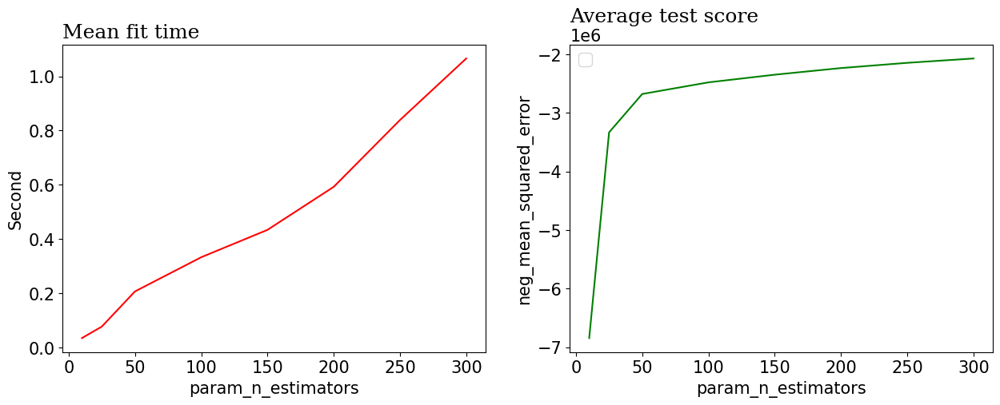

In [61]:
for (p,pg) in zip(param,par_grid):
    
    tree_cv = GridSearchCV(estimator = GradientBoostingRegressor(random_state=2), param_grid = pg, scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
    tree_cv.fit(X_train, y_train)

    df_sensetivity = pd.DataFrame(tree_cv.cv_results_)

    print(p.upper())
    plt.figure(figsize=(8,3))
    plt.plot(df_sensetivity[p],df_sensetivity['split9_test_score'], label="CV9 test score ")
    plt.plot(df_sensetivity[p],df_sensetivity['split8_test_score'], label="CV8 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split7_test_score'], label="CV7 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split6_test_score'], label="CV6 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split5_test_score'], label="CV5 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split4_test_score'], label="CV4 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split3_test_score'], label="CV3 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split2_test_score'], label="CV2 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split1_test_score'], label="CV1 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split0_test_score'], label="CV0 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['mean_test_score'], label="Average test score",color='black', linewidth=4)
    plt.xlabel(param)
    plt.ylabel(" Test score")
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show();

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.plot(df_sensetivity[p],df_sensetivity['mean_fit_time'],color='red')
    ax1.set_title('Mean fit time', fontfamily='serif', loc='left', fontsize='large')
    ax1.set(xlabel=p, ylabel='Second')

    ax2.plot(df_sensetivity[p],df_sensetivity['mean_test_score'],color='green')
    ax2.set_title('Average test score', fontfamily='serif', loc='left', fontsize='large')
    ax2.set(xlabel=p, ylabel='neg_mean_squared_error')

    plt.legend()
    plt.show();

Upon changing few parameters of the refined model, the model is sensitive to all parameters:

(1) Depth of tree: After a depth of three we can see that performance does not get better drastically, so it is wiser to go with lesser depth than more depth to avoid overfitting

(2) Minimum number of samples required to form a leaf node: We can see that after 30 nodes the performance drops significantly. More required samples per leaf results in a sub optimal underfitting model.

(3) Number of estimators (no. of decision trees)

(4) Learning Rate : With a leaerning rate between 0.05 and 0.1 the model performs as good as more learning rate. In an optimal scenario choosing a learning rate that is small but not too small can ensure that a sub optimal model is not formed.

### Extreme Gradient Boosting (XG Boost)

In [62]:
#Extreme Gradient Boosting
from xgboost import XGBRegressor
model4 = XGBRegressor(random_state=2)
model4.fit(X_train,y_train)
evaluate(model4, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model4.get_params())

MSE on train dataset :  3189.93
MSE on test dataset :  1332235.59 

Model Performance - Testing Data
RMSE: 1154.23
MAE: 861.36
R-Sqaure: 0.92
MAPE: 19.83

Parameters: 
 {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'gpu_id': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'predictor': None, 'random_state': 2, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_me

In [63]:
#Hyper-tuning 
param_grid = {
    "learning_rate": [0.025, 0.05, 0.075, 0.1, 0.2],
     'reg_alpha': [None,0,0.5,1,2,3,3.5,4],
     'reg_lambda': [None,0,0.2,0.6,0.8,1,1.5],
    'n_estimators':[20,25,50,100]}

model4 = GridSearchCV(estimator = XGBRegressor(random_state=2), param_grid = param_grid, scoring = 'neg_mean_squared_error',cv = 10, n_jobs = -1, verbose = 0)
model4.fit(X_train, y_train)

evaluate(model4, y_test, X_test,X_train,y_train)
print('\nParameters: \n',model4.best_params_)

MSE on train dataset :  434954.68
MSE on test dataset :  1088557.01 

Model Performance - Testing Data
RMSE: 1043.34
MAE: 783.17
R-Sqaure: 0.94
MAPE: 17.62

Parameters: 
 {'learning_rate': 0.1, 'n_estimators': 50, 'reg_alpha': 3, 'reg_lambda': 0.2}


In [64]:
#Sensitivity Analysis
param=["param_learning_rate",'param_reg_alpha', 'param_reg_lambda','param_n_estimators']

par_grid=[]
par_grid.append ({
    "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.09 ,0.1, 0.15, 0.2,0.3],
     'reg_alpha': [4],
     'reg_lambda': [0],
    'n_estimators':[20]})

par_grid.append ({
    "learning_rate": [0.2],
     'reg_alpha': [None,0,.2,.4,.6,.8,1,1.2,1.5,2,2.5,3,3.5,4,5,6,7,8,10,20],
     'reg_lambda': [0],
    'n_estimators':[20]})

par_grid.append ({
    "learning_rate": [0.2],
     'reg_alpha': [4],
     'reg_lambda': [None,0,.2,.4,.6,.8,1,1.2,1.5,2,2.5,3,3.5,4,5,6,7,8,10,20],
    'n_estimators':[20]})

par_grid.append ({
    "learning_rate": [0.1],
     'reg_alpha': [1],
     'reg_lambda': [0],
    'n_estimators':[10,20,25,50,100,150,200,250]})

PARAM_LEARNING_RATE


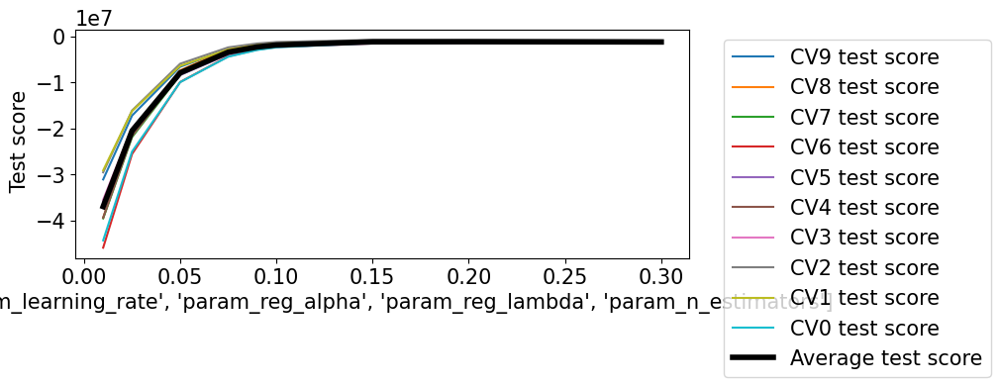

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


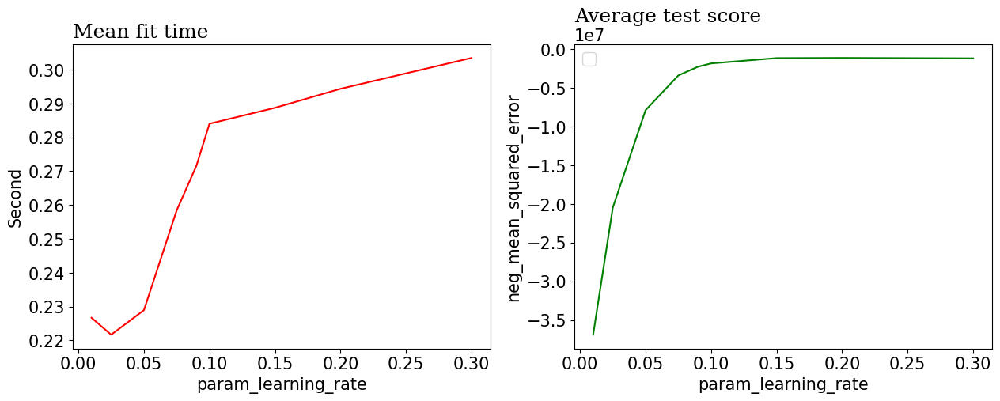

PARAM_REG_ALPHA


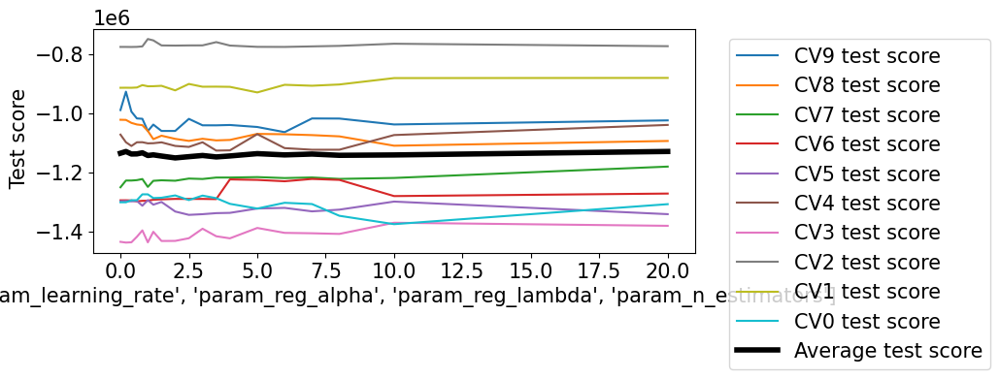

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


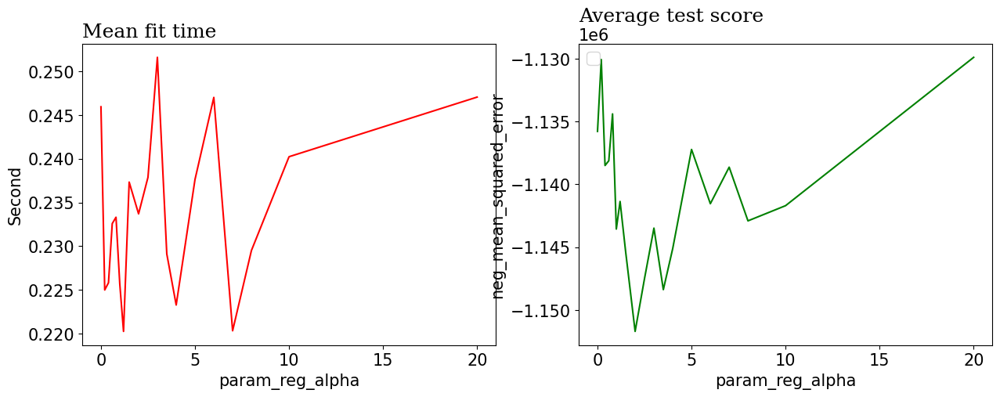

PARAM_REG_LAMBDA


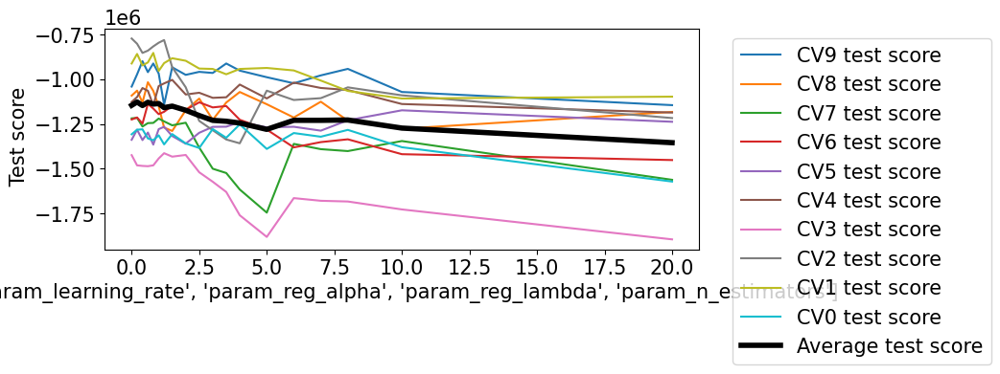

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


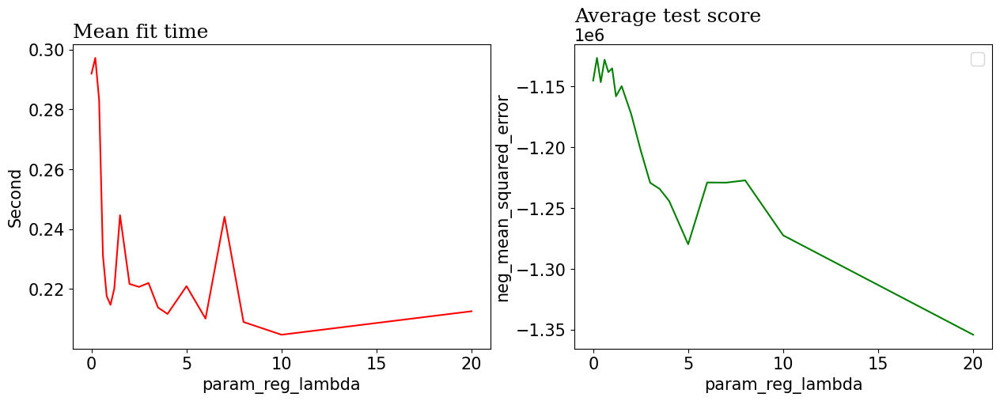

PARAM_N_ESTIMATORS


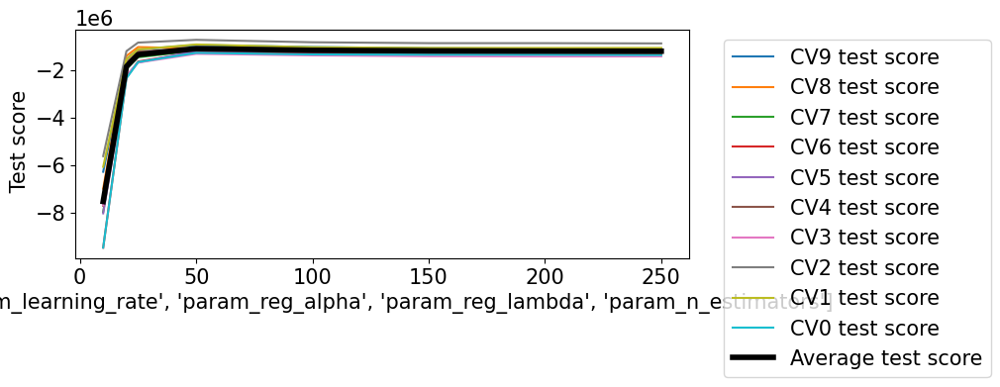

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


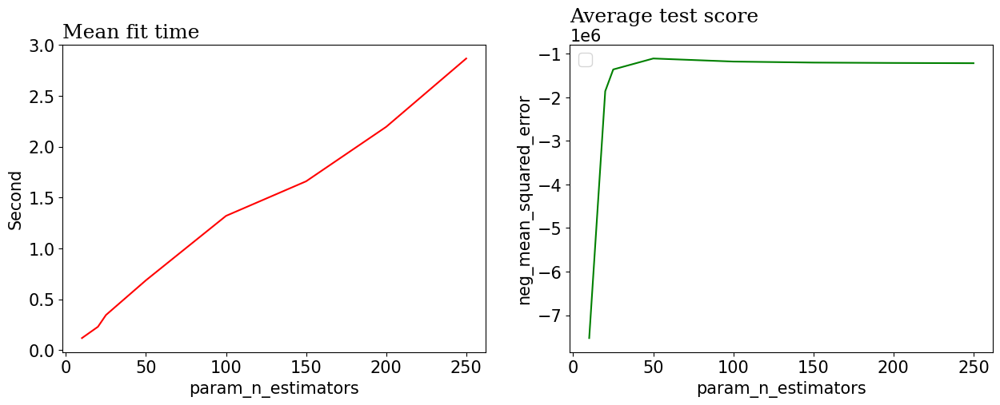

In [65]:
for (p,pg) in zip(param,par_grid):
    
    tree_cv = GridSearchCV(estimator = XGBRegressor(random_state=2), param_grid = pg, scoring = 'neg_mean_squared_error', cv = 10, n_jobs = -1, verbose = 0)
    tree_cv.fit(X_train, y_train)

    df_sensetivity = pd.DataFrame(tree_cv.cv_results_)

    print(p.upper())
    plt.figure(figsize=(8,3))
    plt.plot(df_sensetivity[p],df_sensetivity['split9_test_score'], label="CV9 test score ")
    plt.plot(df_sensetivity[p],df_sensetivity['split8_test_score'], label="CV8 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split7_test_score'], label="CV7 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split6_test_score'], label="CV6 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split5_test_score'], label="CV5 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split4_test_score'], label="CV4 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split3_test_score'], label="CV3 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split2_test_score'], label="CV2 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split1_test_score'], label="CV1 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['split0_test_score'], label="CV0 test score")
    plt.plot(df_sensetivity[p],df_sensetivity['mean_test_score'], label="Average test score",color='black', linewidth=4)
    plt.xlabel(param)
    plt.ylabel(" Test score")
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show();

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.plot(df_sensetivity[p],df_sensetivity['mean_fit_time'],color='red')
    ax1.set_title('Mean fit time', fontfamily='serif', loc='left', fontsize='large')
    ax1.set(xlabel=p, ylabel='Second')

    ax2.plot(df_sensetivity[p],df_sensetivity['mean_test_score'],color='green')
    ax2.set_title('Average test score', fontfamily='serif', loc='left', fontsize='large')
    ax2.set(xlabel=p, ylabel='neg_mean_squared_error')

    plt.legend()
    plt.show();

Upon changing few parameters of the refined model, the model is sensitive to all parameters:

(1) L1 regularization parameter 

(2) L2 regularization parameter

A lower value works better for regularization for getting a lower MSE

(3) Number of estimators (no. of decision trees)

(4) Learning Rate  

The best performing model is Random Forest. Based on the metric, MAE - MAE was picked because we are trying to improve the performance of the model for salary. MAE is the mean absolute error and the direction of residuals do not matter. It takes into consideration the magnitude of difference between actual and predicted, and this is of importance with respect to this particular model. Whether the predicted salary is lesser than or greater than the actual, it still counts as an error and MAE serves this purpose. 

Randome Forest was picked as it has MAE of 763 which is the least amongst all the models that we have built in the above question.

For Random Forest the model is highly sensitive to -
1. Max Depth
2. Max Feautes
3. Max estimators
4. Bootstrap

# Comparing the model's performance using evaluation metrics such as Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and Mean Absolute Percentage Error (MAPE)

In [66]:
#Define Mean Absolute Percent Error (MAPE) function
def MAPE(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [67]:
models=[]
for i in [model1.best_estimator_, model2.best_estimator_, model3.best_estimator_, model4.best_estimator_]:
    mse = mean_squared_error(y_test, i.predict(X_test))    
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, i.predict(X_test))
    r2 = r2_score(y_test, i.predict(X_test))
    mape= MAPE(y_test, i.predict(X_test))
    models.append({f'{i}' : {'MSE':mse , "MAE":mae , 'RMSE':rmse , 'R-Sqaure':r2, 'MAPE':mape}})
    
model_names = ['Model 1: Simple Tree', 'Model 2: RF', 'Model 3: GBM', 'Model 4 XG Boost']

formatted_models = []
for i, model in enumerate(models):
    model_name = model_names[i]
    model_metrics = list(model.values())[0]
    formatted_models.append({'Model': model_name, 'MSE': model_metrics['MSE'], 'MAE': model_metrics['MAE'], 'RMSE': model_metrics['RMSE'], 'R-Square': model_metrics['R-Sqaure'],
                            'MAPE':model_metrics['MAPE']})

df = pd.DataFrame(formatted_models)

df.set_index('Model', inplace=True)

df


,MSE,MAE,RMSE,R-Square,MAPE
Model,,,,,
Model 1: Simple Tree,3.847174e+06,1150.056090,1961.421540,0.779181,20.822102
Model 2: RF,1.076687e+06,764.822763,1037.635306,0.938201,17.361397
Model 3: GBM,1.667732e+06,867.108973,1291.406828,0.904276,18.876384
Model 4 XG Boost,1.088557e+06,783.173880,1043.339354,0.937519,17.622385


Best model is random forest (model 2)


Based on the output, our team would recommend one to use MAE and RMSE. These metrics provide a more accurate and robust representation of error in the model, and an idea of the magnitude of the errors in the model's predictions. Even though we handled the outliers, mean absolute error is much more robust to outliers, including some that we may not have picked up within the categorical data. In addition, the root mean squared error will tell us the difference between the actuals and our predicted values. This is always a good measure to cross-reference for a model's perfomance, because it is very simple for anyone to interpret. 




# Top ten significant variables that affect employee monthly income using the best-selected model - Random Forest

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


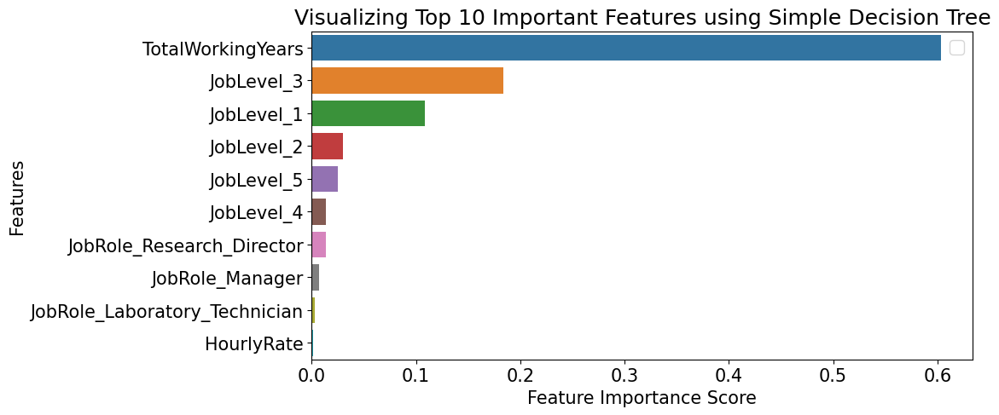

In [68]:
k=X.columns
feature = pd.Series(model2.best_estimator_.feature_importances_,index=k).sort_values(ascending=False)

plt.figure(figsize=(10,5))
sns.barplot(x=feature[0:10], y=feature.index[0:10])
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Top 10 Important Features using Simple Decision Tree")
plt.legend()
plt.show()

Total working years is the  variable with highest score that controls the Montly income followed by Job level 3,Job level 1, Job level 2 and Job level 5 and Job level 4.After these,the montly income is controlled by Job role and on top of it is research Director. Manager Job role and labratory Technician are also impacting the montly income but with less importance score.

# If IBM were to adopt the best model to adjust employee monthly income; what would be their anticipated cost/benefit?

In [69]:
#Predict all the employees monthly income via the Random forest model (model2)
model2.predict(X).sum()

8351348.283407571

In [70]:
#Current employees monthly income
y.sum()

8357940

In [71]:
NetCostBenefit = model2.predict(X).sum() - y.sum()
NetCostBenefit

-6591.716592429206

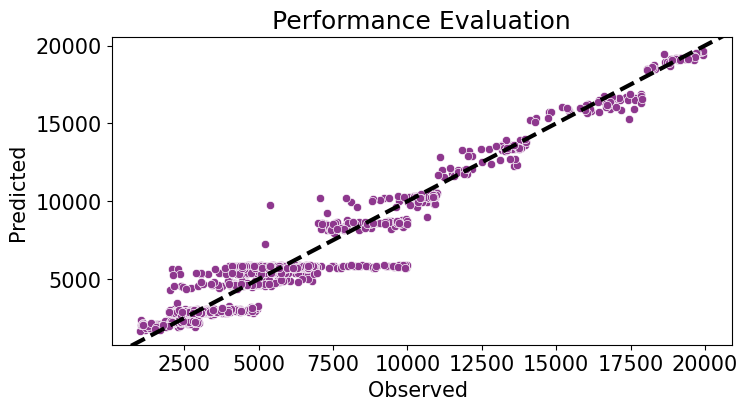

In [72]:
predicted_income = model2.predict(X)
plt.figure(figsize=(8,4))
ax = sns.scatterplot(x=y,y=predicted_income,color='#8E388E')
ax.set(xlabel='Observed ', ylabel='Predicted ')
xpoints = ypoints = plt.xlim()
ax.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=False, scaley=False)
plt.title('Performance Evaluation')
plt.show()

In [74]:
under_paid_employees = np.where(y<predicted_income,1,0).sum()

over_paid_employees = np.where(y>predicted_income,1,0).sum()

print('# of under-paid employees:',under_paid_employees,'which cost $',sum(x for i, x in enumerate(predicted_income) if x < y[i]).round() , '\n' )
print('# of over-paid employees:',over_paid_employees,'which benefit $',sum(x for i, x in enumerate(predicted_income) if x > y[i]).round() , '\n' )
print('Cost/Saving of Adoption:',sum(x-y[i] for i, x in enumerate(predicted_income)).round(),'\n' )

# of under-paid employees: 741 which cost $ 4186689.0 

# of over-paid employees: 646 which benefit $ 4164660.0 

Cost/Saving of Adoption: -6592.0 



# Suggest couple of strategy plan to extend employee’s retention.  

- HR should review the compensation of underpaid employees and address potential attrition risks by advocating for fair wage adjustments.

- HR should make effort to collect information on industry benchmarks to determine if the company is providing competitive wages.

- Proper wages should be given to provide support for employees living far from company such as transportation,  transportation allowance, working from home, time flexibility. 
